# **Lending Lifecyle** 🟡

## **Application Scorecard** 🟢

**Purpose**: Evaluate the creditworthiness of a borrower when they apply for a loan or credit.
- Approval or rejection of the application
- Loan terms (e.g., interest rate, credit limit)

**Data**: Typically uses data collected during the loan application process, such as:
- Applicant's income
- Employment details
- Credit history
- Demographics
- Existing debt obligations

**Target variable**: If a customer defautled or not (1 or 0)

**Model**: A statistical model (e.g., logistic regression or machine learning models) assigns a score that predicts the probability of default (likelihood of not repaying the loan).  We to be able to predict who will default and who won't to be able to better score future customers.



### **Data** 🟢

To train an application scorecard scoring model, we use historical data that captures the characteristics of past "successful" applicants and their subsequent repayment behavior. This data helps the model predict the likelihood of default for new applicants. 

In credit risk modeling, banks often create training, testing, and holdout datasets instead of just the typical train-test split because of the high-stakes nature of credit decisions, regulatory requirements, and the need to ensure robust and unbiased model performance over time. 

1. **Training Dataset (50%)**: Used to train the model by finding the optimal parameters that minimize prediction errors.
2. **Testing Dataset (30%)**: Used to evaluate the model's performance during development. It is used to tune hyperparameters and evaluate intermediate iterations of the model.
3. **Holdout Dataset (20%)**: A completely independent dataset reserved until the final stages of model development. Acts as a proxy for future data to validate how the model will perform in real-world scenarios. It provides a final unbiased assessment of model performance.

Regulatory bodies often require banks to demonstrate that the model has been tested on independent data that was not used in any way during training or tuning. The holdout dataset is a key part of this evidence. The holdout dataset simulates this scenario, providing insight into how well the model will perform on new customers.

Credit risk models often remain in use for years. The holdout dataset can be used to assess whether the model is stable over time, especially if the holdout data is drawn from a later time period.



### **Sampling** 🟢

Sampling methods are techniques used to select a subset of individuals or items (a sample) from a larger population for analysis. 

1. **Probability Sampling** 

In probability sampling, every member of the population has a known and non-zero chance of being selected. 
- Simple Random Sampling: Each member of the population has an equal chance of being selected.
- Stratified Sampling: The population is divided into subgroups (strata) based on shared characteristics (e.g., age, income). A random sample is taken from each stratum.

2. **Non-Probability Sampling**

In non-probability sampling, not all members of the population have a chance of being included. This approach is faster and cheaper but may introduce bias.

### **Feature Selection** 🟢


#### **Weights of Evidence (WoE)** 🟢

Weight of Evidence (WoE) is a statistical transformation of a categorical or numerical variable that measures the strength of association between a predictor (independent variable) and a binary target variable (dependent variable). It is widely used in credit risk modeling, particularly for building scorecards (e.g., application or behavioral scorecards), because it provides a monotonic transformation and is easy to interpret particularly logistic regression.

For each bin or category of a variable, WoE is defined as:

$\text{WoE}_i=\ln(\Large\frac{\text{Good\%}_i}{\text{Bad\%}_i})$
- Proportion of good (non-default) observations in bin: $\text{Good\%}_i=\large{\frac{\text{Good Count}_i}{\text{Total Good Count}}}$
- Proportion of bad (default) observations in bin: $\text{Bad\%}_i=\large\frac{\text{Bad Count}_i}{\text{Total Bad Count}}$

Divide the variable into discrete bins (e.g., intervals for numerical variables or categories for categorical variables). Ensure each bin has a meaningful number of observations.
- Positive WoE indicates a higher proportion of "good" customers in the bin.
- Negative WoE indicates a higher proportion of "bad" customers in the bin.

WoE transformations are monotonic if the variable is binned appropriately, which is useful for logistic regression.

#### **Information Value (IV)** 🟢

Information Value (IV) is a statistical measure used to quantify the predictive power of an independent variable (feature) in relation to a binary target variable (e.g., default or no default). It evaluates how well a feature differentiates between two groups, typically "good" (non-defaulting) and "bad" (defaulting) customers in credit risk modeling. IV is commonly used to assess the usefulness of variables when building models like logistic regression.

Variables with high IV values are more predictive and valuable for the model. The IV for a feature is calculated as:

$\text{IV}=\Sigma(\text{WoE}_i\times(\text{Good\%}_i-\text{Bad\%}_i))$

Variables with IV > 0.1 are typically shortlisted for modeling. For categorical variables, IV is calculated by grouping categories and applying the same process. IV helps prioritize which features to retain in logistic regression or other interpretable models.

Unlike correlation, which captures linear relationships, IV considers the non-linear relationship between a feature and the target. Compared to tree-based feature importance (e.g., in XGBoost), IV is more interpretable and suitable for transparent models like logistic regression.

Poor binning can lead to inaccurate IV values. Does not account for interactions between variables.

#### **PSI** 🟢

The Population Stability Index (PSI) is a statistical metric used to measure the stability or shift in the distribution of a variable (typically a model's score or feature) between two datasets—commonly the training data and a new dataset (e.g., current population or test data). It helps assess whether a machine learning model continues to perform well over time and ensures the data distribution remains consistent.

$\text{PSI}=\Sigma_{i=1}^{n}(A_i-E_i)\times\ln(\large\frac{A_i}{E_i})$

PSI is calculated for each feature across the training and current datasets. During feature selection, PSI can help identify variables that are prone to instability. Variables with high PSI  (above a threshold, e.g., 0.25) indicating instability, may not generalize well to unseen data and could be excluded or engineered to improve stability. 

 If PSI indicates significant population drift, it may signal the need for:
- Model recalibration (adjusting parameters for current data trends).
- Full retraining with updated datasets to ensure accuracy and relevance.

PSI plays a vital role in monitoring and maintaining the performance and stability of machine learning models in production. It provides insights into data and model stability, helping banks and financial institutions proactively manage risks, ensure compliance, and maintain high-quality decision-making.



#### **Hypothesis Testing** 🟢

Hypothesis testing can be used to see whether a specific variable (feature) significantly impacts the target variable (e.g., loan default likelihood). Example: Testing if income level significantly correlates with default rates. It it can also be used in verifying if model improvements (e.g., after hyperparameter tuning) are statistically significant.

1. **Parametric Tests**: Assumes data follows a specific distribution (e.g., normal distribution).
    - **Z-Test**: Used when population variance is known, often for large samples.
    - **t-Test**: Used when population variance is unknown, typically for smaller samples.
    - **ANOVA**: Tests differences between means of three or more groups.

2. **Non-Parametric Tests**: Makes no assumptions about the data distribution.

3. **Chi-Square Test**: Tests relationships between categorical variables (e.g., default status and marital status).
4. **Correlation Tests**:
    - **Pearson’s Correlation**: Measures linear relationships.
    - **Spearman’s Rank Correlation**: Measures monotonic relationships.

##### **Z-Test**

In credit risk modeling, Z-tests are commonly used due to their suitability for large datasets and normality assumptions. A small p-value (e.g., $p<0.05$) suggests strong evidence against $H_0$, leading to its rejection. $H_0$: Income does not affect default probability.

p-values are primarily associated with statistical models, like logistic regression, where their purpose is to test hypotheses about individual predictors (features). However, their application in machine learning models like XGBoost is limited. These models are designed to optimize predictive performance and do not compute coefficients or assumptions about the data distribution.

##### **Correlation Test**

Identify features that are highly correlated with the target variable and retain them for modeling. Compute the Pearson correlation coefficient $r$ between each continuous feature and the target variable (binary or continuous proxy). Retain features with high correlation both positive and negative since they may have predictive power. Example: If income has $r=−0.8$ with default status, it is a strong candidate for inclusion in the model.


##### **Multicollinearity Test**
Refers to a situation where two or more independent variables in a dataset are highly correlated, meaning they contain redundant information. This concept plays a significant role in training models, particularly in linear models like logistic regression, and has different implications depending on the algorithm used. High correlation among variables makes it difficult for the model to determine the unique contribution of each variable. Coefficients lose their interpretability because it's unclear how much of the effect is attributable to a single variable versus its correlated counterparts. 

In contrast to logistic regression, XGBoost and other tree-based algorithms are less sensitive to multicollinearity. Although XGBoost is less sensitive to multicollinearity, redundant features can increase computational cost without improving performance.

### **Supervised Learning** 🟢

Supervised learning involves training models on labeled data, where the target variable is known.

1. **Classification**: Predicting a discrete category or class label
    1. *Binary Classification*: Predicting whether a loan will default (yes/no).
        - Logistic Regression
    2. *Multiclass Classification*: Classifying customers into risk bands (low, medium, high).
        - Random Forest
        - Support Vector Machines (SVM)
        - XGBoost
2. **Regression**: Predicting a continuous numerical value. E.g. Predicting the amount of a loan a customer will apply for. Forecasting house prices.
    - Linear Regression
    - Decision Trees
    - Gradient Boosting Machines (e.g., XGBoost, LightGBM)
3. **Time Series**: Predicting future values based on historical data.
    - ARIMA
    - LSTMs and GRUs (Neural Networks for sequential data)
    - Prophet

#### **Logistic Regression** 🟢

Logistic regression is a commonly used statistical technique in credit risk modeling due to its simplicity, interpretability, and effectiveness in binary classification problems, such as determining whether a borrower will default (1) or not default (0) on a loan. The model estimates a score (between 0 and 1) that represents the likelihood of default based on borrower characteristics and financial behavior.

Logistic regression models the relationship between a set of independent variables (e.g., income, credit history length) and a binary target variable (default or no default) by applying a **logistic (sigmoid) function** to a linear equation. Provides a continuous risk score rather than a binary result, enabling nuanced decisions (e.g., risk-based pricing). Easy to implement and explain to stakeholders. You can decide to build different models for different segmentations.

The model creates a linear equation: 

$z=\alpha + \Beta_1 X_1 + \Beta_2 X_2 + ... + \Beta_n X_n$
- $\Beta_i$ are the coefficients (weights) learned during model training.
- $X_i$ are the independent variables (features).

The logistic regression model transforms $z$ into a probability using the sigmoid function

$p=P(y=1)=\frac{1}{1+e^{-z}}$

By default, a threshold (e.g., 0.5) is applied to classify outcomes. If $p>0.5$ then $y=1$ else $y=0$.

**Loss Function**: The model minimizes the log-loss or negative log-likelihood, which measures the difference between predicted probabilities and actual outcomes.

**Limitations**: Logistic regression assumes a linear relationship between features and the log-odds of default, which might not always hold. If defaults are rare (imbalanced dataset), the model may perform poorly without adjustments (e.g., oversampling or weighting).

#### **XGBoost** 🟡

XGBoost (Extreme Gradient Boosting) is a high-performance, scalable machine learning algorithm often used in credit risk modeling for its ability to handle complex, non-linear relationships between variables. XGBoost excels in capturing complex patterns and interactions in the data, making it particularly effective for high-dimensional or non-linear datasets. 

**Ensemble Learning**: XGBoost is an ensemble learning technique based on gradient boosting, which builds a series of decision trees sequentially to minimize the prediction error. XGBoost combines multiple weak learners (decision trees) into a strong learner. Each tree focuses on correcting the errors made by the previous trees. At each step, XGBoost uses the gradient (first derivative of the loss function) and the Hessian (second derivative) to optimize predictions.
- First Tree: Predicts initial probabilities (e.g., default rate = 10% across the dataset). Splits data to minimize error (e.g., splits on "Credit History Length").
- Residual Calculation: Computes residuals (difference between actual and predicted probabilities).
- Second Tree: Focuses on residuals and further refines predictions by splitting on another feature (e.g., "Income").
- Final Prediction: Combine the outputs of all trees to get a probability score for default.

**Benefits**: Unlike logistic regression, XGBoost can model complex, non-linear interactions between features. It can make some incorrect inferences so you have to do some spot checks e.g. Actuary vs Nurse and their PDs. It identifies the most important variables contributing to predictions (feature importance).

**Limitations**: XGBoost models are harder to interpret than logistic regression, though feature importance and SHAP values can help. More computationally intensive, especially for large datasets. Requires careful tuning (e.g., learning rate, number of trees, max depth) to achieve optimal performance.

### **Model Evaluation** 🟢

Evaluating model performance is essential to understand how well a model generalizes to new data. Both XGBoost (a tree-based model) and Logistic Regression (a statistical model) can be evaluated using a variety of metrics. The evaluation techniques can vary depending on whether the task is binary classification, multiclass classification, or regression.

#### **Balanced Datasets**

**Accuracy**

The proportion of correctly classified instances (both true positives and true negatives) out of the total instances. Accuracy is not reliable in imbalanced datasets (e.g., when one class is much more frequent than the other).

#### **Unbalanced Datasets**

**Precision (Positive Predictive Value)**

The proportion of true positive predictions out of all predicted positive cases.

**Recall (Sensitivity, True Positive Rate)** 

The proportion of true positive predictions out of all actual positive cases.

**F1-Score**

The harmonic mean of Precision and Recall. Useful when you need a balance between Precision and Recall.

**ROC Curve**

A plot of the True Positive Rate (Recall) against the False Positive Rate (1 - Specificity) across different thresholds.

**AUC (Area Under the Curve)**

The area under the ROC curve; a value between 0 and 1, where:
- 1 means perfect model performance.
- 0.5 indicates a random classifier.
- 0 means a perfect model misclassfier.

**Gini Coefficient**

The Gini coefficient is widely used in credit risk modeling, particularly for evaluating classification models like Logistic Regression or XGBoost. It is closely related to the ROC curve and AUC (Area Under the Curve). The Gini coefficient measures the ability of a model to separate the classes (e.g., defaulters vs. non-defaulters).

$\text{Gini Coefficient}=2\times\text{AUC}-1$

Gini is a scaled version of AUC, ranging from -1 to 1.
- 0 means model performs no better than random guessing.
- 1 means perfect model separation.
- -1 means perfect model misclassification.

### **Risk Bands** 🟢

Probability scores or **PDs** are transformed into a credit score (e.g., 300–900 range).

$\text{Score} = \text{Base Score} + \text{Factor} \times \log\frac{1-\text{PD}}{\text{PD}}$

Banks use the transformed risk scores to categorize customers into risk groups or bands.
- Approval or Rejection: Customers in low-risk bands may be approved, while high-risk customers are rejected.
- Pricing Decisions: Interest rates may be adjusted based on risk bands (e.g., lower rates for low-risk borrowers).
- Portfolio Analysis: Banks can assess the risk distribution across their portfolio by analyzing risk group proportions.

## **Behavioural Scorecard** 🟢

A behavioral scorecard is a tool used by financial institutions to assess the ongoing creditworthiness of existing customers based on their observed behavior and account activity. Unlike application scorecards, which evaluate the risk of a new customer at the time of application, behavioral scorecards focus on monitoring and predicting the future risk of customers who are already part of the institution's portfolio.


**Purpose**: Behavioral scorecards typically calculate a behavioral risk score for each customer. 
- Risk Monitoring: Identify customers who are becoming riskier over time.
- IFRS9 ECL Update: Update PD and EAD term structure (same dataset to be used) to account for changing portfolio
- Credit Line Management: Adjust credit limits based on customer behavior (e.g., increase for good behavior, decrease for risky patterns).
- Early Warning System: Detect early signs of potential delinquency or default.
- Portfolio Segmentation: Group customers into different risk or behavior categories for targeted actions.
- Customer Retention: Identify high-value, low-risk customers to offer retention incentives.
- Regulatory Compliance: Meet requirements for ongoing risk monitoring under frameworks like Basel III.

**Data**: Behavioral scorecards rely on dynamic and historical time data from a customer's interactions and account activity.
- Payment History: Number of missed or late payments, days past due.
- Utilization Rate: Percentage of credit limit used.
- Repayment Behavior: Proportion of outstanding balance repaid monthly.
- Transaction Patterns: Frequency, type, and size of transactions.
- External Data (if applicable): Credit bureau updates, including new defaults or inquiries on other accounts.

**Target variable**: The target variable for a behavioral scorecard typically represents future risk or customer behavior, such as:
- Probability of delinquency (e.g., being 30, 60, or 90 days past due in the next 6–12 months).
- Likelihood of default within a specific time horizon. e.g. 1m PD, 12m PD
- Propensity to close an account or churn.


**Model**: Behavioral scorecards often use logistic regression or advanced machine learning techniques like XGBoost or Random Forests, depending on complexity and interpretability requirements. Several methods handle the time-to-default dimension in credit risk modeling, allowing for dynamic estimation of default probabilities and better understanding of credit risk over different time horizons. The choice depends on:
- Regulatory requirements for transparency.
- The need for explainability (common in credit risk models).


### **Data** 🟢

Dataset has monthly loan performance observations for each loan 𝑖 = 1, ..., 𝑁 with 𝑁 = 650,715 20-year mortgage loans. Each loan 𝑖 is therefore observed over discrete time $𝑡 = 𝑡_1, ..., T_𝑖 $ from the time of its first month-end observation $𝑡_1$ up to the end of its lifetime $T_𝑖$. These amortising mortgages were sampled from January 2007 up to December 2022, during which time new mortgages were continuously originated, thereby yielding 47,939,860 raw monthly observations of loan repayment performance. Loans that predate the start of this sampling window, i.e., left-truncated loans, are retained along with their subsequent observations throughout this window. Aside from possessing a rich input space for predictive modelling, this dataset includes fundamental credit fields such as net cash flows (receipts), expected instalments, arrears balances, month-end balances, variable interest rates, original loan principals, the amount and timing of write-offs and early settlement.

In [10]:
from datetime import datetime, timedelta

from faker import Faker
import pandas as pd

# Initialize the Faker object
fake = Faker()
accounts = 100
periods = 36

# Generate a list of monthly dates for the last 10 years at the first of each month
start_date = datetime.today().replace(day=1)
dates = [start_date - timedelta(days=30 * i) for i in range(periods)]
dates = [date.replace(day=1) for date in dates]

historical_data = pd.DataFrame()
for account in range(accounts):
    account_number = account + 10001
    account_data = {
        "account_number": [account_number for _ in range(periods)],
        "snapshot_date": dates,
        "balance": [fake.random_int(min=-15000, max=1000) for _ in range(periods)],
    }

    historical_data = pd.concat([historical_data, pd.DataFrame(account_data)], ignore_index=True)

historical_data.head()

,account_number,snapshot_date,balance
0,10001,2025-03-01 14:23:07.478799,-1450
1,10001,2025-01-01 14:23:07.478799,-1156
2,10001,2024-12-01 14:23:07.478799,-4656
3,10001,2024-12-01 14:23:07.478799,-9055
4,10001,2024-11-01 14:23:07.478799,-2505


### **Deliquency Measure** 🟢

A delinquency measure quantifies the gradual erosion of trust between bank and borrower in honouring the credit agreement. The $𝑔_0$-measure (or the unweighted number of payments in arrears) which is constructed from **days past due** (DPD) is used for its intuitive appeal and industry-wide ubiquity.

Banks commonly specified **three payments (or 90 DPD)** in arrears as a pragmatic point of ‘default’, long before the introduction of the Basel II Capital Accords. That said, this threshold can generally range between 30–180 days based on managerial discretion and some analysis

### **Default Indicator** 🟢

One can compare $𝑔_0(𝑡)$ at time 𝑡 against the specifiable threshold 𝑑=3. Thus the default status at time t can be denoted as:

$D_t= [g_0(t) \geq d]$ where $d=3$

Where [𝑎] are Iverson brackets that outputs 1 if the enclosed statement 𝑎 is true and 0 otherwise.



The loan’s resulting binary-valued default indicator, can now be used within a typical cross-sectional modelling setup for predicting future default-outcomes.

In preparing the modelling dataset, we observe all predictive information of loan $𝑖$ at a particular time 𝑡. Then, the loan’s future default-status at time $𝑡 + 𝑘$ is merged to the observations at 𝑡, thereby taking a snapshot between two points in time, or a cross-section. However, the chosen value for this third parameter $𝑘 ≥ 0$ (or outcome period) is what we will define as our **$k$-month default indicator** which will then be used to determine our **$k$-month PD**.

More formally, a process $Z_𝑡(𝑑, 𝑘) = D_{t+k}$ prepares a given loan’s monthly performance history by evaluating $D_t$ at ‘future’ time $𝑡 + 𝑘$, though assigns the result to time 𝑡.

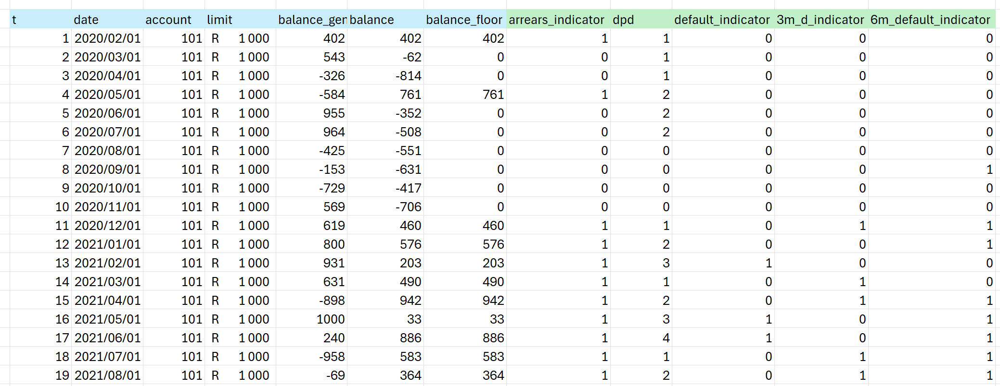

### **Curing Rule**

A default flag can be created under the following alternatives of cure.

#### **Instant Cure**

An account returns to performing immediately after the cause of default is removed.

#### **Probabtion Period**

This is used when an account needs to wait for a certain amount of time (e.g. 6m) before returning to performing. It reduces the risk of multiple defaults.

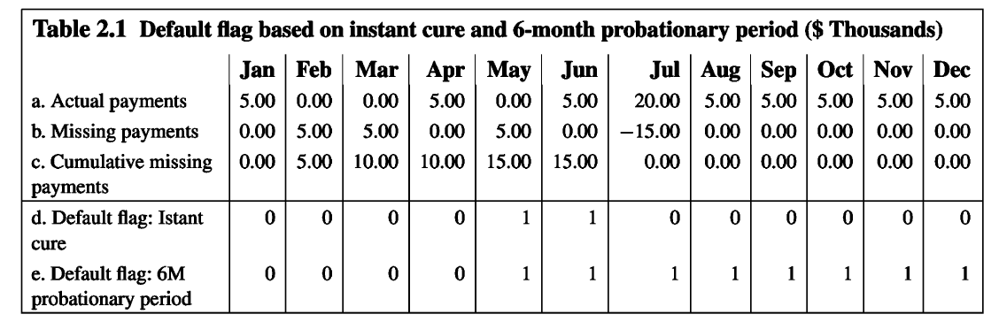

### **Stratified Clustered Random Sampling** 🟢

Accordingly, we use stratified clustered random sampling by extracting from $D$ the full credit histories of 200,000 loans, comprising 14,314,925 monthly observations over a period of 192 months. These loan keys are randomly selected within each stratum, where strata are formed by grouping $D$ based on the date of loan origination, e.g., Jan-2007. Of these 200,000 loans, 70% are randomly relegated into the training set $D_𝑇 ∈ D_𝑆$ whilst the remainder are sorted into the validation set $D_𝑉 ∈ D_𝑆$; both of which are used in fitting the MLR-models. Regarding the resampling scheme for BR-models, we aggregate both $D_𝑇$ and $D_𝑉$ to the portfolio-level in calculating the respective
transition rates

### **Forward Default Rates** 🟢

We measure the representativeness of the sets $\{D_𝑆,D_𝑇, D_𝑉\}$ by comparing the **𝑣-month forward default rate** across these sets. Let $𝐷_{𝑖,𝑡}$ be a Bernoulli random variable that denotes the default status of loan 𝑖 at time 𝑡, i.e., 1 if in state D, and 0 otherwise. In creating a **𝑣-month forward default indicator**, we use the worst-ever aggregation type (§3.1.3) that indicates future default at present time 𝑡 whenever any of the next 𝑣 ≥ 1 statuses $𝐷_{𝑖,𝑡+1}, ..., 𝐷_{𝑖,𝑡+v}$ equals one. The worst-ever 𝑣-month conditional probability of a non-defaulted loan 𝑖 is then 

$P(\max [𝐷_{𝑖,𝑡+1}, . . . , 𝐷_{𝑖,𝑡+v}] = 1 | 𝐷_{𝑖,𝑡} = 0)$. 

Therefore a 12-month conditional default probability will be 

$P(𝐷_{𝑖,𝑡+12}] = 1 | 𝐷_{𝑖,𝑡} = 0)$

Regarding its estimation, assume that a longitudinal dataset $D' = \{𝑖, 𝑡, 𝑑_{𝑖,𝑡}\}$ consists of $ 𝑑_{𝑖,𝑡} ∈  D_{𝑖,𝑡}$ default status outcomes, whereafter $D'$ can be partitioned into a series of non-overlapping subsets $D'(t')$ over calendar time $t' = t'_1 , . . . , 𝑡′_𝑛$. 

The aforementioned probability can then be estimated at the portfolio-level by the 𝑣-month default rate, defined over 𝑡' for a given $D'$ as:

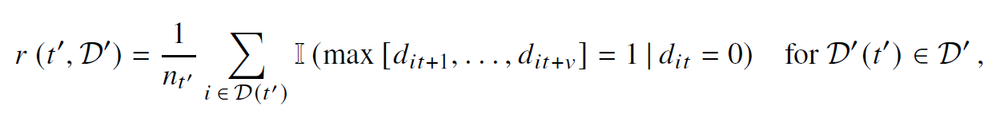

where $𝑛_𝑡'$ denotes the size of the at-risk population within each subset $D'(t')$. Finally, and in verifying sampling representativeness using the equation above, we graph and compare the $v$-month default rate over time and across the various datasets. We furthermore calculate the mean absolute error (MAE) between $D$ and each respective sample, $D_𝑇$ and $D_𝑉$. If these values are low then the sample is representative of the population.

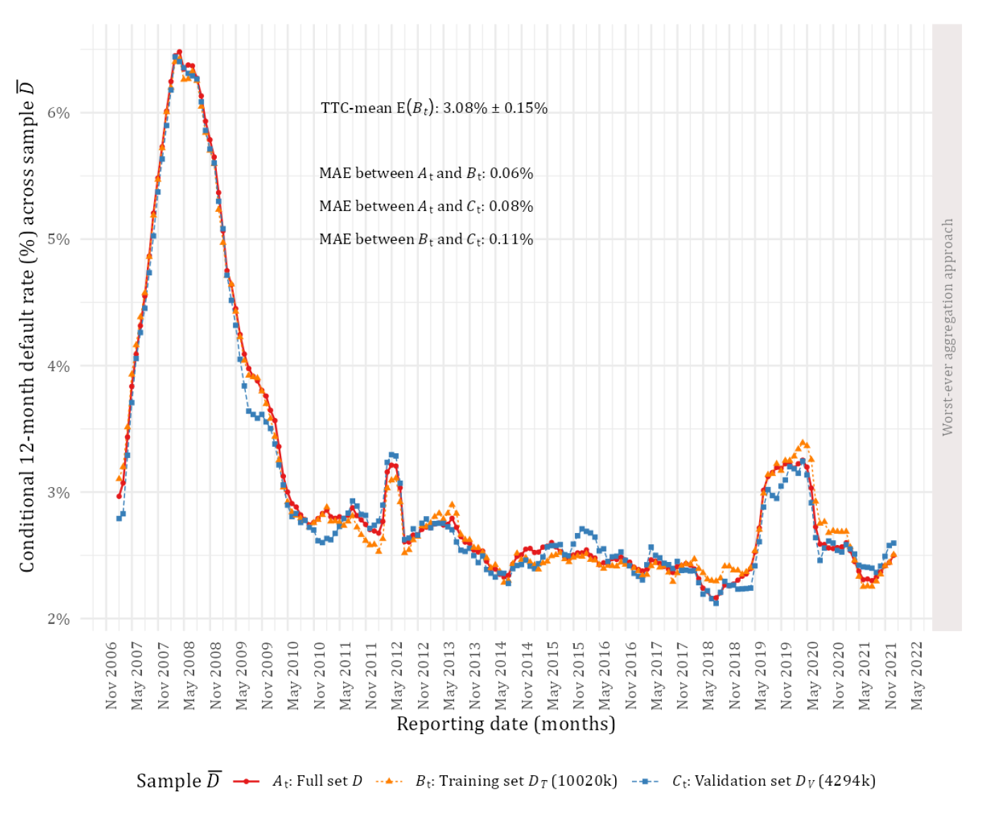

#### **Number Weighted Default Rates**

The method above calculates default rates by considering the number of accounts, treating all defaults equally, regardless of exposure size.

$\text{NW Default Rate}=\Large\frac{\Sigma(\text{Default Flag}_i)}{\Sigma\text{Accounts}_i}$

This is used when the focus is on account-level performance, customer segmentation, or building behavioral scorecards. Useful for corporate business banking when there is low number of accounts.

#### **Exposure Weighted Default Rates**

In this method, default rates are calculated by weighting each default event by the corresponding exposure (e.g., balance or loan amount).

$\text{EW Default Rate}=\Large\frac{\Sigma(\text{Balance}_i\times\text{Default Flag}_i)}{\Sigma\text{Balance}_i}$

Typically used when capital allocation, loss estimation, or regulatory compliance (e.g., Basel standards) is the focus. Emphasizes large exposures since their defaults have a more significant financial impact.



### **Stochastic Processes** 🟢
- **Discrete-Time Markov Chains**: Models the movement of accounts through different credit risk states (e.g., Stage 1, Stage 2, Stage 3, Default) over discrete time intervals. Transition probabilities between states are estimated, often as a function of covariates. The time-to-default is inferred from the likelihood of moving into the "default" state within a given number of steps.
- **Continuous-Time Markov Chains**: Extends Markov models to continuous time, allowing for a more granular view of transitions. Common in portfolio-level credit risk models or for modeling multi-state processes like curing and defaulting.


#### **Markov Chains** 🟢

Due to borrower optionality and the vicissitudes of life, a loan may reside in any one of the following four states at any point 𝑡 of its lifetime T : 1) Performing (P), Defaulted (D), Settled (S), and Written-off (W). A performing loan is typically up-to-date on its payments, though it may accrue payments in arrears until reaching the default threshold, at which point the loan transits to state D. From either of these two transient (and communicating) states {P,D}, a loan may also move into one of the two absorbing states, {S,W}, whereupon observation of the loan ceases thereafter. Practically, and aside from behavioural profiles, the only difference between S and W is a non-zero
outstanding balance for W that will need to be written-off as a credit loss.

Let $𝑌_𝑡$ ∈ S denote a random variable that can assume one of these four states at time 𝑡 in our state space S ∈ {P,D, S, W}. The sequence $𝑌_{1} , . . . ,𝑌_{T}$ then forms a discrete-time first-order Markov chain. Assuming stationarity, the transition matrix $T$ that governs this Markov chain will have as entries the transition probabilities $𝑝_{𝑘𝑙}$ from state 𝑘 to 𝑙, i.e., $𝑝_{𝑘𝑙} = P (𝑌_𝑡 = 𝑙 | 𝑌_{𝑡−1} = 𝑘)$ between any two points in time $𝑡 − 1$ and $𝑡$.

The maximum likelihood estimates (MLEs) of each $𝑝_{𝑘𝑙}$ is $𝑛_{𝑘𝑙}/𝑛_{𝑘}$, where $𝑛_{𝑘𝑙}$ is the number of observed transitions from 𝑘 to 𝑙 across the sampling window, while $𝑛_{𝑘}$ denotes the number of total transitions starting in 𝑘. The resulting 𝑇 (Transition Probability Matrix) is therefore expressed as


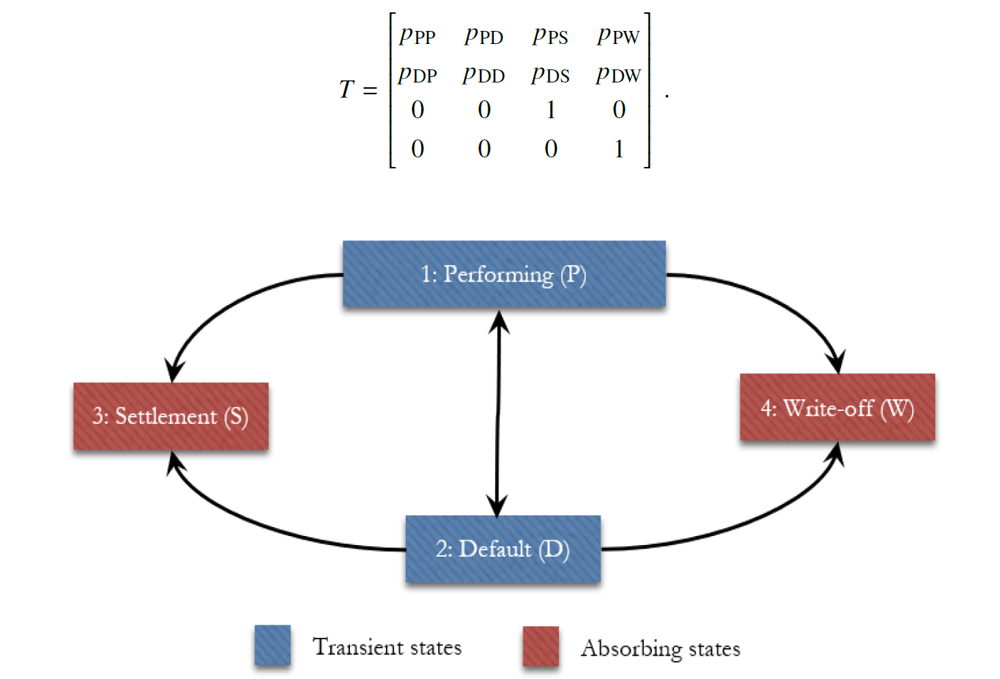

Moreover, our condensed input space allows for incorporating several delinquency-themed
variables in predicting the transition P→D.
- $S_0$: Current
- $S_1$: 1 to 30 days past due (DPD)
- $S_2$: 31 to 60 DPD
- $S_3$: 61 to 90 DPD
- $D$: Default

##### **Soujourn Times**

The mean sojourn time for an object in a dynamical system is the amount of time an object is expected to spend in a system before leaving the system. It is the time spent in state 𝑘 before moving to state 𝑙. The various histograms are all heavily right-skewed, which is to be expected, though the degree thereof differs markedly; e.g., the distribution of P → D vs that of P → S. By inspecting these distributions graphically, it is clear that they are surely not exponentially distributed. This result
serves as further proof that the Markov-property is indeed violated, given its requirement for sojourn times to be exponentially distributed.

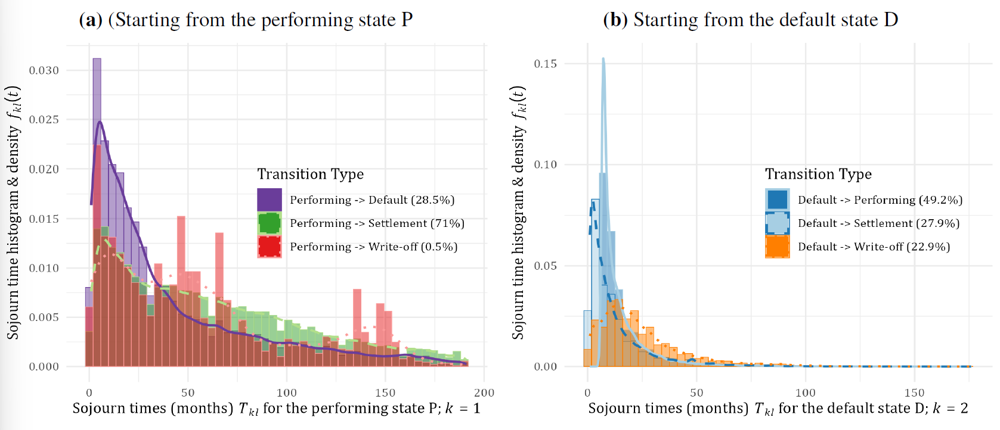


##### **Initial State Vector** 🟢

Represents the distribution of accounts across states at time $t=1$. For $n$ states, the vector $v_1$ has elements $v_{1,i}$ where it is the proportion of accounts in state $i$ at $t=1$.

##### **PD Term Structure** 🟢

Use the TPM to project the distribution of accounts across states over multiple time steps. At time $t$ the state vector $v_t$ is given by:

$v_t = v_1 T^t$

After 12 time steps $t=12$, the probability of an account being in the Default state $D$ is given by the corresponding element in $v_{12}$.



### **Survival Analysis** 🟢
- **Cox Proportional Hazards (CPH) Model**: Semi-parametric model focusing on the relationship between covariates and the hazard rate. Assumes proportional hazards (the relative risk of default remains constant over time for different groups).
- **Kaplan-Meier Estimator**: Non-parametric method to estimate the survival function
- **Parametric Survival Models**: Assumes a specific functional form for the survival distribution (e.g., Weibull, Exponential, Log-Normal). Parametric models can provide more stable estimates for small sample sizes or when time-dependence is critical.

#### **Cox Proportional Hazards Model** 🟢

The Cox Proportional Hazards (CPH) model is a survival analysis technique widely used in credit risk modeling to estimate Probability of Default (PD) over time. The model's flexibility in handling censored data and its ability to analyze the relationship between covariates and the hazard rate (risk of default) makes it a valuable tool for calibrating PDs.

**Hazard Function**

Represents the instantaneous risk of default at time $t$, given that the borrower has survived up to $t$.

$h(t|\bar{X})=h_0(t)e^{\beta_1 X_1 + \beta_2 X_2 + ... + \beta_n X_n}$

- $h_0(t)$: Baseline hazard function (shared across borrowers, non-parametric).
- $X_i$: Vector of covariates (borrower characteristics, macroeconomic factors, etc.).
- $\beta_i$: Vector of coefficients estimated by the model.

**Survival Function**

Represents the probability of surviving (not defaulting) up to time t

$S(t|\bar{X})=e^{-\int_0^t h(u|\bar{X}) du}$

**Time-to-default (TTD)**

Calculate the time to default for each account or time until the end of the observation period for non-defaulted accounts (censored data). Fit the CPH hazard model. The model estimates $\beta$, the impact of covariates $X$ on the hazard rate, while leaving the baseline hazard rate unspecified (semi-parametric).

**PD Term Structure**

Convert the estimated hazard function into survival probabilities using the survival function. From survival probabilities, derive the cumulative default probability.

$F(t|\bar{X}) = 1 - F(t|\bar{X})$

For a specific time horizon $T$, i.e. the 12-month PD can be extracted as:

$\text{PD}_{12m}(X)=F(T=12|\bar{X})$

Assumes that the effect of covariates on the hazard rate is constant over time. Violations of this assumption can lead to biased estimates.


### **ML Supervised Learning** 🟢
- **Discrete-Time Logistic Regression**: Converts the time-to-default problem into a series of binary classification problems for each time interval. Each observation-period pair becomes a row in the dataset, with a binary indicator for default in that interval. The cumulative default probability is aggregated across time intervals.
- **Survival Trees and Random Survival Forests (RSF)**: Tree-based models adapted for survival data. Estimates the survival function for each observation by aggregating survival probabilities from tree nodes. Useful for handling non-linear relationships and high-dimensional data.
- **Gradient Boosting Survival Models**: Extends boosting algorithms like XGBoost or LightGBM to handle time-to-event data.
Incorporates survival-specific loss functions (e.g., Cox loss or negative log-likelihood of survival probabilities).
- **Deep Learning Approaches**

#### **Beta Regression** 🟢

The time-homogeneous transition matrix 𝑇 from Eq. 1 can be easily re-estimated as a time-dependent quantity $𝑇(𝑡')$ over calendar time 𝑡' = $𝑡'_1, . . . , 𝑡'_n$, e.g., Jan-2007 to Dec-2022. Having partitioned the data by monthly cohort 𝑡′, each matrix element in $𝑇(𝑡')$ is the time-dependent transition probability $𝑝_{𝑘𝑙}(𝑡')$ from state 𝑘 to 𝑙, estimated simply using MLE as:

$𝑝_{𝑘𝑙}(𝑡') = \large\frac{n_{𝑘𝑙}(𝑡')}{n_{𝑘}(𝑡')}$

In particular, $n_{𝑘𝑙}(𝑡')$ denotes the number of transitions from 𝑘 to 𝑙 during the interval $(𝑡' − 1, 𝑡']$, while $n_{𝑘}(𝑡')$ similarly represents the total volume of transitions starting in 𝑘 during the same interval.

For each (k,l), you then get a time series of specific transition probabilities: 

$𝑇(𝑡')^{kl} = 𝑇(𝑡_1')^{kl}, ..., 𝑇(𝑡'_n)^{kl}$

This time series may then be modelled using a beta regression (BR) model.


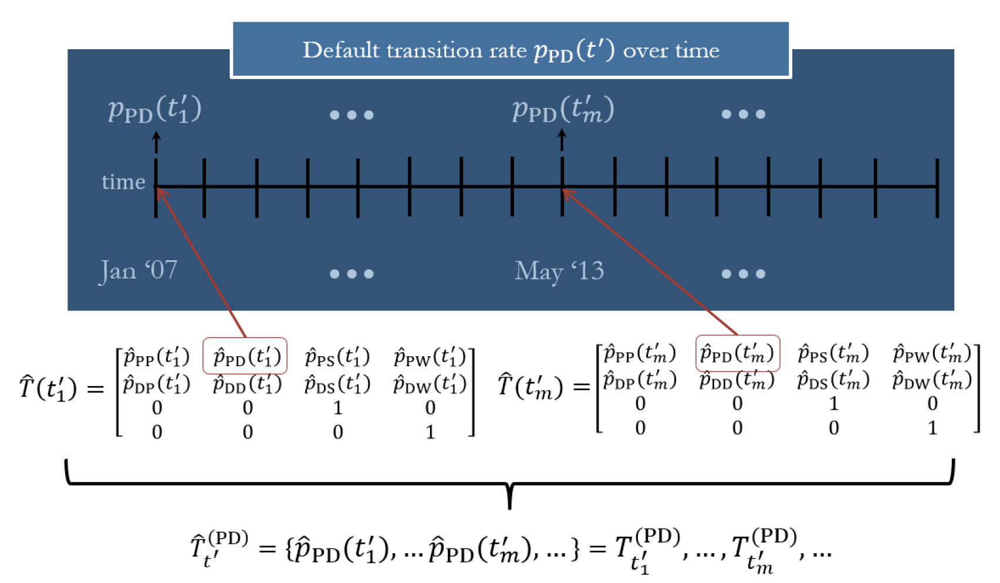

Consider the dataset $D = \{𝑡', 𝑘, 𝑙, 𝑇(𝑡')^{kl} ,X_1(𝑡')^{kl} , X_2(𝑡')^{kl}\}$ over calendar reporting time $𝑡' = 𝑡'_1 , . . . , 𝑡'_𝑛$. We shall construct a set of BR-models with variable dispersion (VDBR), one for each transition type of interest, from state 𝑘 to 𝑙. In so doing, we relate the transition rate $𝑇(𝑡')^{kl}$ over 𝑡' with two sets of input variables, denoted by $X_1(𝑡')^{kl}$ and $X_2(𝑡')^{kl}$, which contain predictive information that are specific to the transition type 𝑘 → 𝑙; thereby embedding heterogeneity at the portfolio-level e.g. proportion of loans in arrears, prevailing inflation rate. Each BR-model is then constructed by modelling both its mean $\mu(𝑡')^{kl}$ and precision $\sigma(𝑡')^{kl}$ parameters for state 𝑘 to 𝑙.

#### **Multinomial Logistic Regression** 🟢

In statistics and probability, "multinomial" refers to a generalization of the binomial distribution, used to model scenarios where each trial can result in one of several possible outcomes, rather than just two (like success or failure). 

The probabilities $\{𝑝_1, ..., 𝑝_𝑗, ... , 𝑝_J\}$ of assuming any particular outcome 𝑗 can be written in terms of the category counts $𝑛_1, ..., 𝑛_𝑗, ..., 𝑛_𝐽$. These category counts follow a
multinomial distribution, which yields the joint probability of assuming any particular combination of category counts. An MLR-model then relates the conditional probability $𝑝_𝑗(𝒙_𝑗) = P(𝑌=𝑗|𝒙)$ to a set of input variables $𝒙_𝑗$ for category 𝑗 using a logit link function 𝑔(·). In particular, and with reference to some baseline-category $J' ∈ [1, J]$, the conditional mean $\mu _{𝑗𝑖}$ for the 𝑗th outcome and for loan 𝑖 = 1, . . . , 𝑛 is modelled as:

$g(\mu _{ij})=\log\Large\frac{𝑝_𝑗(𝒙_{ji})}{𝑝_𝑗(𝒙_{J'i})}$ $ = \beta_{j0} + \beta_{j1}x_{ji1} + ... + \beta_{j1n}x_{jin}$ for $j\neq J'$

The formulation in Eq. 14 implies that an MLR-model will have 𝐽 − 1 logit functions, where each model 𝑗 has a separate coefficient vector $𝜷_𝑗$ from the next model. In turn, one will have to estimate (𝐽 − 1)(𝑝 + 1) coefficients in total.

Now when we consider the time component, let $y_{it}$ denote the observed value from $Y_t$ for loan $i$ over its lifetime $T$ at each discrete time point $t = t_1, . . . , T$ . These $y_{it}$ ∈ {P, D, S, W} values are nominal in nature and are
encoded accordingly for the ending state 𝑙 = 1, . . . , 4 as:

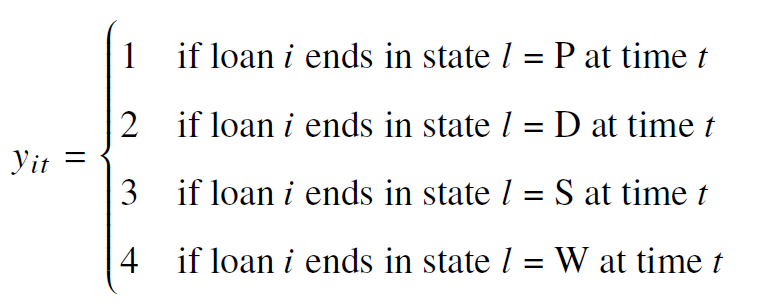

The various transition probabilities $𝑝_{𝑘𝑙}$ can be written as a linear function of input variables $X_i^{𝑘𝑙}$ , i.e., $𝑝_{𝑘𝑙}(X_i^{𝑘𝑙}) = P(Y_t=l | Y_{t-1}=k, X_i^{𝑘𝑙})$ for loan $i$ with a with a vector of $n$ characteristics.

We shall fit two MLR-models respective to the starting states 𝑘 ∈ {P, D}, since the
other states are absorbing.

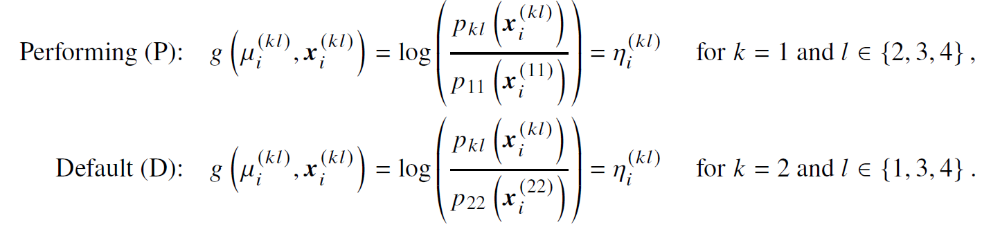

Lastly, the input variables $X^{𝑘𝑙}$ of the MLR-models reprise those from the beta regression model  denoted as $X(𝑡',[m])^{kl}$ and $X(𝑡',[p])^{kl}$ for the $m$ th time period of the $p$ observations, but also incorporate the following loan account-level $[a]$ idiosyncratic variables:

1. time-fixed variables specific to loan 𝑖, denoted by $X(𝑡',[a])^{kl}$, e.g., the chosen payment method;
2. time-dependent variables specific to loan 𝑖 and period 𝑡, denoted by $X(𝑡',t,[a])^{kl}$, e.g., the delinquency level.

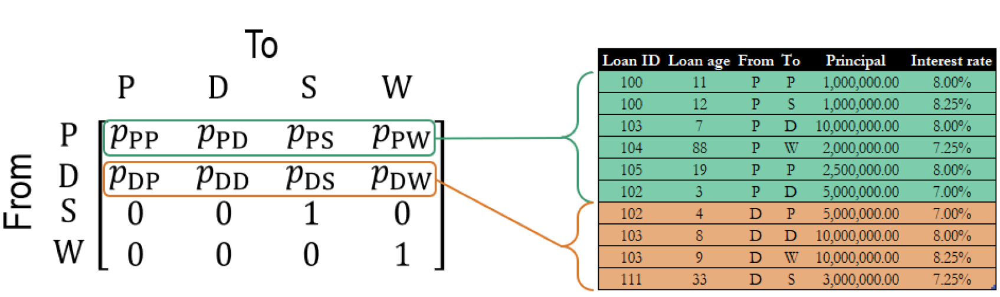

#### **Binary Logistic Regression** 🟢

Instead of MLR-models, future work can pursue fitting a binary logistic regression model for each transition type. The literature on using binary logistic regression (LR) as a generic supervised classifier is quite extensive and its use within banking is ubiquitous, particularly in the field of application credit scoring, as was first demonstrated in Wiginton (1980). The technique is considered by many authors to be the **most successful modelling technique** thus far in quantitative finance.

Beyond application credit scoring, this technique is also typically used in pre-screening loan offers, detecting fraud cases, scoring collection success, informing direct marketing offers, and in risk-based pricing.

At the very least, this technique and its results can serve as a benchmark when using more advanced classification techniques in future.

For each $m$-month PD for each loan $i$ the logit function can be defined as

$g(\mu _{j})=\log\Large(\frac{𝑝(𝒙_{i})}{1-𝑝(𝒙_{i})})$ $ = \beta_{0} + \beta_{1}x_{i1} + ... + \beta_{1n}x_{in}$ 

#### **XGBoost** 🟢

Using machine learning models like XGBoost to calibrate m-month PDs is a practical alternative to traditional models such as the Cox Proportional Hazards (CPH) model or Markov Chains, particularly when handling large datasets with complex non-linear relationships. The goal is to train a machine learning model (e.g., XGBoost) to predict the m-month Probability of Default (PD) directly or infer it through intermediate predictions (e.g., month-by-month PDs). 

Use account-level data to determine whether an account defaults within m months **(TTD)**. Optionally, create intermediate targets for shorter time horizons (e.g., 1-month PDs). For each account i, create a binary target (1 if account defaults within m months, 0 otherwise)


### **Model Evaluation** 🟢

#### **Akaike Information Criterion** 🟢

As explained by Akaike (1998), a parsimonious model uses the smallest number of inputs relative to the sample size, whilst achieving the maximum GoF-value; itself measurable using the well-known Akaike Information Criterion (AIC).

#### **Pseudo R-squared** 🟢

Another useful GoF-measure is the pseudo coefficient of determination for BR-models, denoted as $𝑅^2_F$ ∈ [0, 1], which Ferrari and Cribari-Neto (2004) described as the squared sample correlation between the linear predictors.

For the MLR-models, we use the McFadden pseudo $𝑅^2_\text{McF}$ ∈ [0, 1] measure, which compares the deviance of a fitted model to that of the null model, as detailed by McFadden (1972) and Menard (2000).

#### **Statistical Significance Test** 🟡

Secondly, we test the statistical significance of a particular input, which is based on both the Wald-statistic for BR-models (given their small sample sizes) and the likelihood ratio test for MLR-models (given their large sample sizes), as discussed by Heinze et al. (2018).

#### **Kolmogorov-Smirnov Test** 🟢

It is standard practice in statistical modelling to analyse the residuals $𝑟_𝑖 = 𝑦_𝑖 − \hat 𝑦_𝑖$ between a model’s predictions $\hat 𝑦_𝑖$ and the outcomes $𝑦_𝑖$ for observations 𝑖 = 1, . . . , 𝑛, thereby assessing the model’s goodness-of-fit to its training data. However, these ‘raw’ residuals of BR-models are not typically used given that the outcomes (and the resulting BR-models) are generally heteroscedastic, as discussed by Ferrari and Cribari-Neto (2004) and Cribari-Neto and
Zeileis (2010). Instead, these authors suggested that one should use Pearson residuals (also called standardised ordinary residuals), which are calculated as:

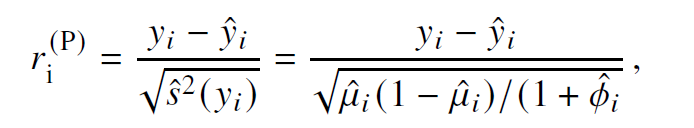

For each of the BR-models, we compare the distribution of Pearson residuals to a standard normal distribution. We then analyse the Pearson residuals of each BR-model in gauging the model fit, and tested the residual distributions for normality using the  Kolmogorov-Smirnov (KS) test at a significance level of 𝛼 = 5%.

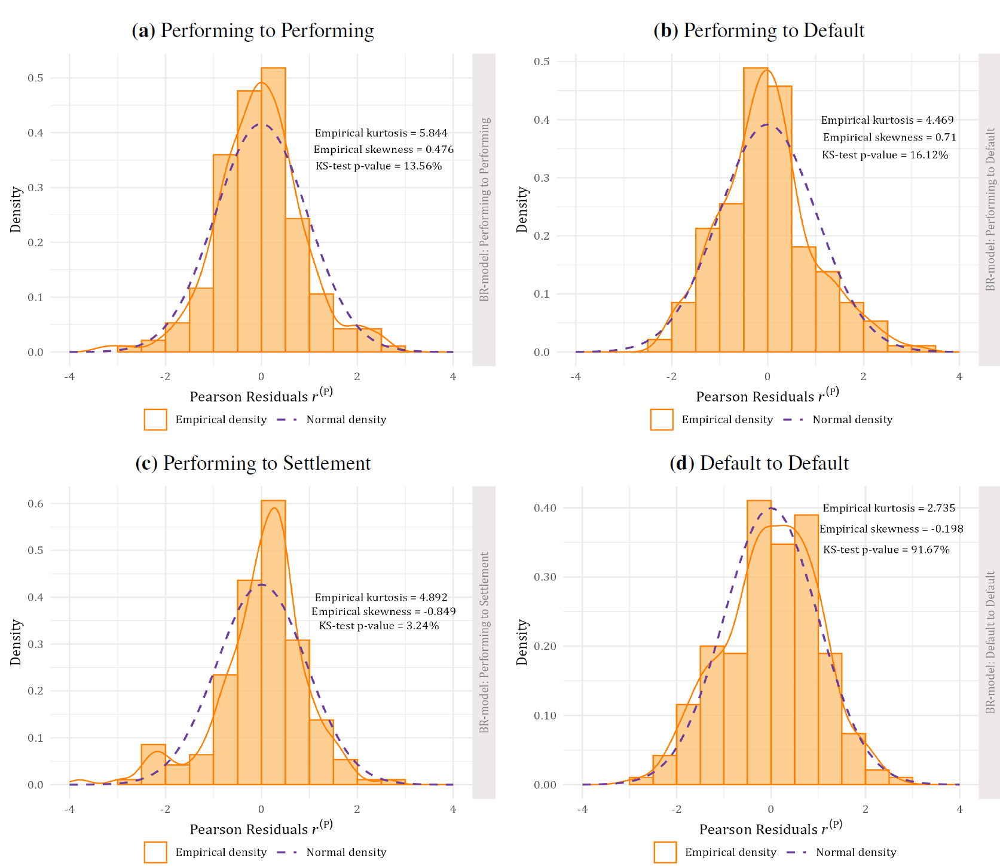

#### **AUC & ROC** 🟢

In summarising an ROC-analysis on each transition type 𝑘 → 𝑙, the AUC is
calculated both in-sample within $D_𝑇$ and out-of-sample within $D_𝑉$. Each AUC-statistic is accompanied by 95% confidence intervals, calculated using the DeLong-method.

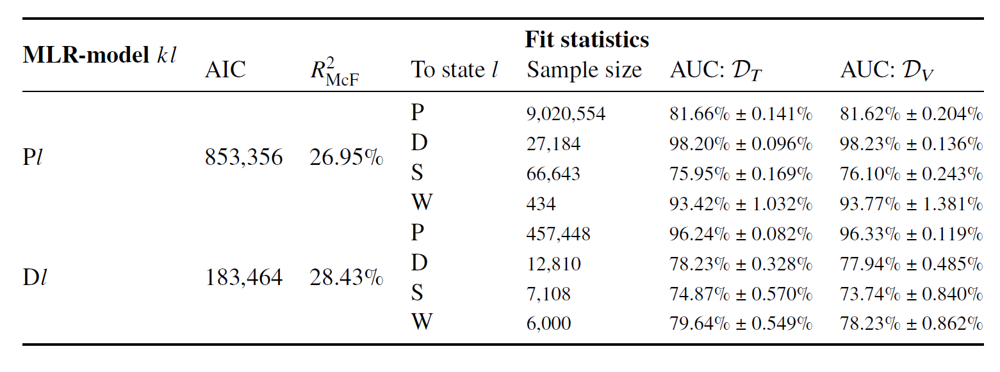

#### **AvE Backtesting (Many Cohorts to One Rate)** 🟢

Our models may be compared by aggregating their predictions to the portfolio-level using the $m$-month state transition rate of type 𝑘 → 𝑙. The BR-models already produce predicted transition rates at the
portfolio-level over calendar time. For comparison purposes, we therefore need only contend with aggregating those predictions from the loan-level MLR-models to the portfolio-level.

Accordingly, the arithmetic average is taken across the loan-level predictions for all loans 𝑖 in each monthly cohort, all of which reconstitutes the validation set. We then express the MLR-variant of the portfolio-level predicted transition rate at any given 𝑡' as:

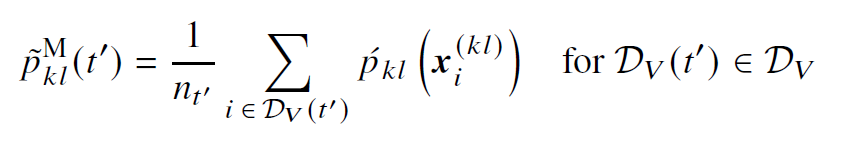

This can also be done on an exposure weighted basis.

These expected estimates can now be compared over 𝑡' to the actual time-dependent transition rate. Note that the corresponding estimate that arises from the Markov chain remains the same across all 𝑡'.

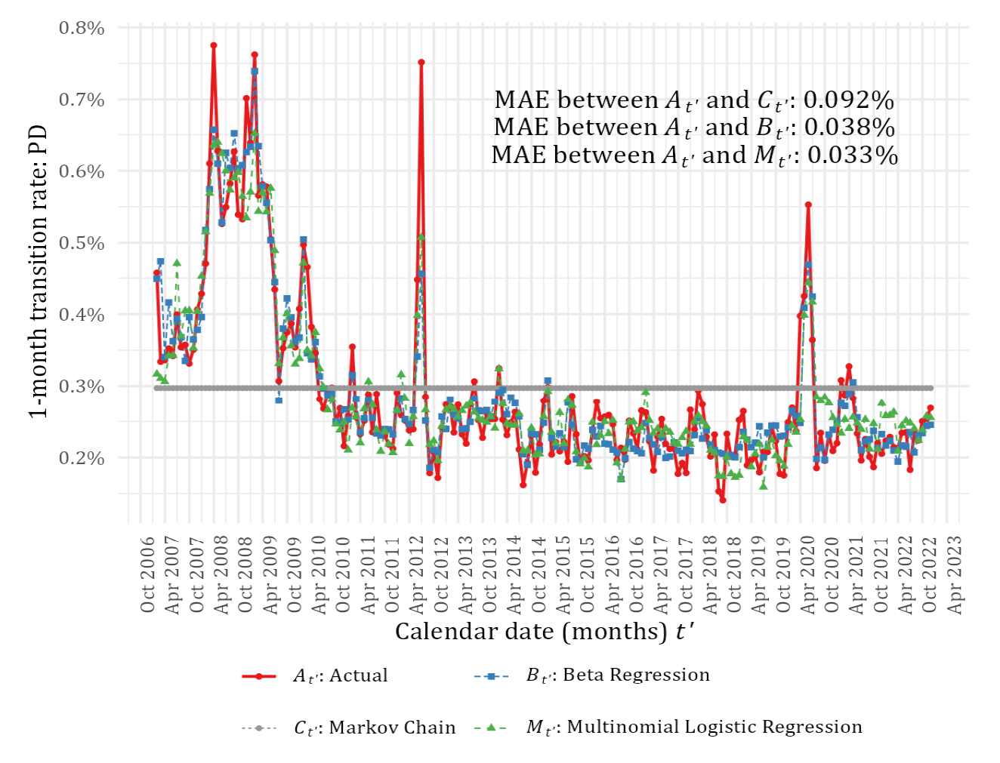

#### **Term Structure Backtesting (1 Cohort to Many Rates)** 🟢

Aside from the m-month state transition rate, we also assess our models by calculating and comparing the implied PD term-structures of all loans within a particular loan cohort e.g. 𝑡' = Jan-2007, which is observed until maturity.

In particular, consider the empirical (actual) transition matrices $\hat 𝑇(𝑡′1), ..., \hat 𝑇(𝑡′_𝑛)$, with elements $\hat 𝑝_{𝑘𝑙}(𝑡') = \large\frac{n_{𝑘𝑙}(𝑡')}{n_{𝑘}(𝑡')}$. These matrices are multiplied recursively as $𝑇^*(𝑡') = \hat 𝑇(𝑡'−1) \hat 𝑇(𝑡')$

i.e., It is the collection of PIT probabilities at each $𝑡'_𝑗$ , having survived up to $𝑡'_{𝑗 − 1}$. In this study, we are however interested only in those cumulative transition rates of type P→D, which signify the PD-term-structure.

Furthermore, we form a time-dependent expected transition matrix $𝑇^{(e)} (𝑡')$ from the portfolio-level estimates of 𝑝_{𝑘𝑙}(𝑡') that result from each modelling technique, having aggregated the loan-level
predictions from the MLR-model using the arithmetic average equation from above.

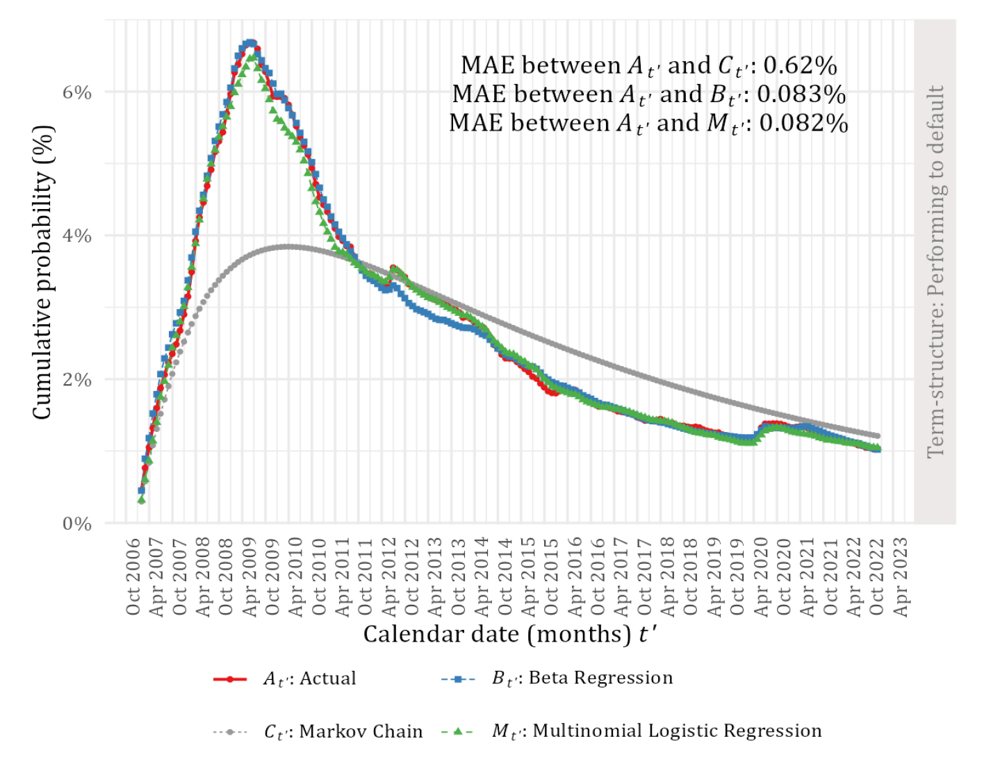

#### **Mean Absolute Error** 🟢

The level of agreement between any combination of actual and expected transition rates can be measured as follows. We compute the MAE between any two rates and compare the subsequent MAE-based values across modelling techniques, which is similar to the use of MAE in testing the sampling representativeness. 


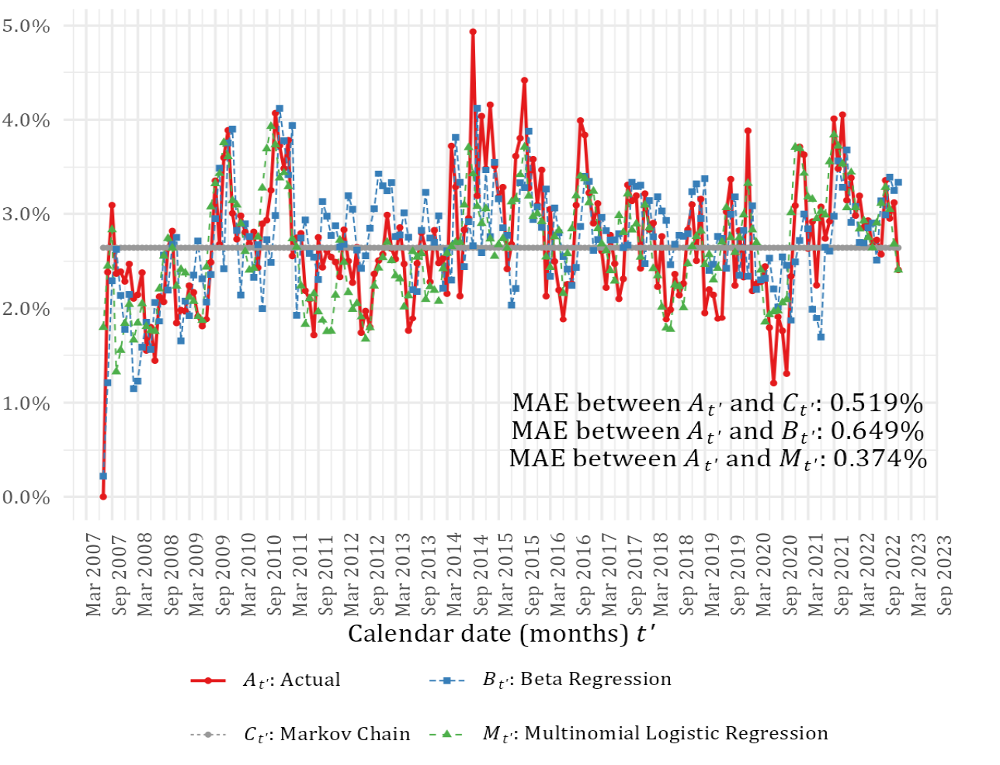

#### **MAE Average Discrepancy Statistic** 🟢

Using the validation sets, this method of comparison relies again on the aforementioned MAE-based statistic, whereby the m-month transition rates – as produced by each modelling technique – are calculated, compared, and summarised
over time into a single portfolio-level statistic.

These AD-statistics confirmed visual analyses. More formally, and for any pair of rates $\{𝑟_1(𝑡'), 𝑟_2(𝑡')\}$ observed over calendar time 𝑡', we define the MAE-based average discrepancy (AD) statistic as:

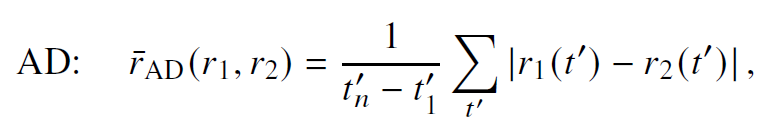

#### **Confidence Interval Backesting**

Having calculated the measurement error, the confidence interval per snapshot i and horizon t, is constructed using a normal test by assuming a 95% confidence level:

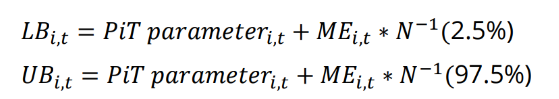

To get the backtest conclusion (pass/fail), it needs to be identified if the observed values fall within the bounds calculated around 
the PIT parameters:

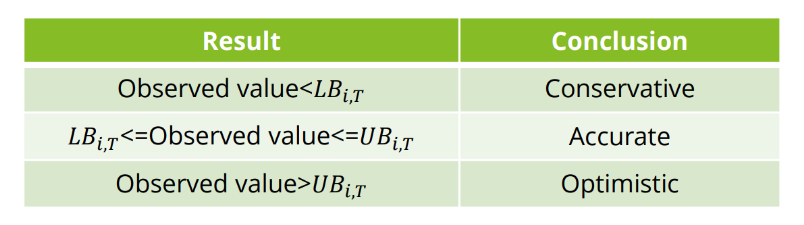

For the share of snapshots that fall outside of the confidence bounds, the materiality of potential model errors is estimated as the impact assessment on 
provisions. The impact on provisions is a sum of the partial impacts per each time horizon. The partial impact per horizon is equal to the average relative 
exceedance of confidence bounds over the I reporting dates in horizon t times the provision amount in horizon t:

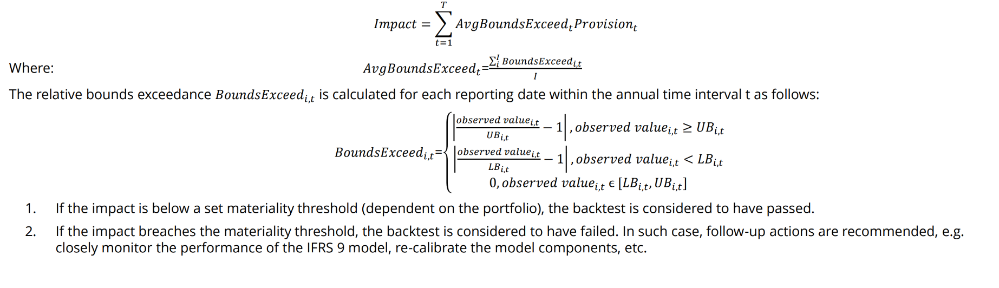

#### **Gini Backtesting** 🟡

Discriminatory power measures the model's ability to rank accounts correctly by default risk. High discriminatory power (e.g., Gini ≈ 0.7 or higher) indicates the model can distinguish between high-risk and low-risk accounts.

**Snapshot-Based Backtesting**

Evaluate Gini/AUC at multiple time points (snapshots). Compare predicted probabilities or scores against actual defaults over the evaluation horizon.

**Stage-Based Segmentation**

Segment accounts into Stage 1 (low risk) and Stage 2 (high risk). Expect Stage 1 + Stage 2 Ginis to be high (e.g., 0.6–0.8) but Stage 2 Ginis to be lower, reflecting lower discriminatory power within already high-risk accounts.


# **IFRS 9 Impairment Models** 🟡

IAS 39 and IFRS 9 are accounting standards issued by the International Accounting Standards Board (IASB) for financial instruments, particularly their recognition, measurement, and impairment. IFRS 9 replaced IAS 39 in 2018 to address the limitations and complexity of IAS 39 “incurred loss” framework, providing a more forward-looking and simplified approach. Under IAS 39, losses were recognized only when there was objective evidence of impairment (e.g., default or delinquency). Hence it was backward-looking, meaning it relied on historical data and loss events already incurred. This delayed provisioning during the 2008 financial crisis, leading to underestimation of risks.

https://www.bis.org/fsi/fsisummaries/ifrs9.pdf

The principle is to forfeit a portion of income today into a loss provision that ideally offsets amounts that may
be written-off tomorrow. Doing so helps to smooth overall earnings volatility, which is itself a central tenet of risk
management. IFRS 9 requires that this loss provision be regularly updated based on a statistical model, i.e., the asset’s Expected Credit Loss (ECL). Given a new ECL-value, a bank adjusts its loss provision either by raising more from earnings or releasing a portion thereof back into the income statement. This ECL-model represents the probability-weighted sum of cash shortfalls that a bank expects to lose over a certain horizon, incorporating forward-looking information.

The calculation of impairment under IFRS 9 generally involves the following steps


## **Staging** 🟢

Regarding the ECL’s calculation, IFRS 9 adopts a staged approach in §5.5.3 and §5.5.5 that is based on the extent of the perceived deterioration in the underlying risk. In principle, each of the three stages requires a
progressively more severe ECL-estimate. Financial assets are categorized into three stages based on their credit risk:

### **Stage 1 (Performing Assets)**

Assets that have low credit risk or where there has been no significant increase in credit risk since initial recognition. Impairment is calculated based on 12-month ECL (expected credit losses within the next 12 months). As soon as a financial instrument is originated, 12-month ECL would be recognised in the P&L.

### **Stage 2 (Underperforming Assets)** 

Assets that have deteriorated quite significantly in their credit quality or where there has been a significant increase in credit risk (**SICR**) but no default from the point of origination (recognition). Impairment is based on Lifetime ECL (expected credit losses over the entire remaining life of the asset).

### **Stage 3 (Non-performing Assets)** 

Assets that are objectively credit-impaired or in default (their future cash flows are likely compromised). Impairment is also based on Lifetime ECL but includes adjustments for actual losses.

As can be seen IFRS9 does actually say in quantitative terms how to determine these stages. However, it is common in industry standard to denote it as such:
- Stage 1: No payments missed or partial arrears e.g. DO on 25th but you pay on the 10th
- Stage 2: 30 days to 89 days in Arrears
- Stage 3: 90+ days in arrears. This is classified as default

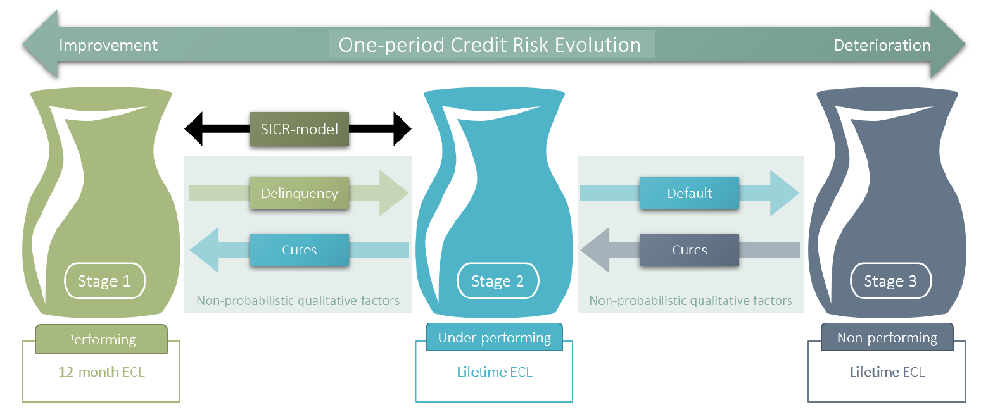

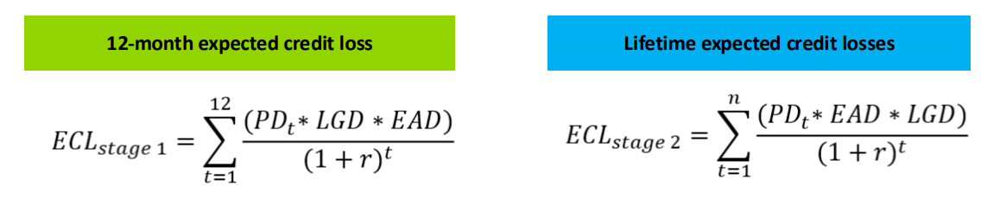


### **NPL Ratio** 

You can determine the non-performing loan ratio by taking the proportion of loans in stage 3 divded by the total loan book to see how badly your book is performing.

## **PD (Probability of Default)** 🟢

Lending poses the fundamental risk of capital loss should the borrower fail to repay their loan, which necessitates the accurate prediction of the borrower’s underlying probability of default (PD). This task usually involves finding a statistical relationship between a set of borrower-specific input variables and the binary-valued repayment outcome (i.e., defaulted or not) over some outcome period.

The literature on this particular classification task is considerable and spans various forms of supervised statistical learning, including machine learning.

### **Through-the-Cycle (TTC) PDs** 🟢

Credit rating systems focus mostly on producing a conservative PD-estimate that remains **static (but stressed)** over the lifetime of each loan, often by design. The broad goal of such systems is to facilitate the estimation of **regulatory and economic capital**, which should absorb any catastrophic **(or unexpected) losses** under the Basel framework from the BCBS. Any temporal effects that might affect the PD during loan life are therefore largely ignored, together with any macroeconomic influences; particularly since the latter is already assumed to be stressed to a recession-like level during PD-estimation. Doing so renders the resulting PD-estimates as **through-the-cycle (TTC)** in that they should at least approximate the long-run averages of 1-year historical default rates over a full macroeconomic cycle, as required during capital estimation. While
these TTC PD-estimates are certainly stable over time by design, they are also typically inaccurate within any other setting besides capital estimation.

Put simply, a Through-the-Cycle Probability of Default (TTC PD) is a measure of the likelihood that a borrower will default over a specific time horizon, calculated in a way that smooths out fluctuations caused by economic or business cycles. It reflects a borrower's **average risk of default** under both favorable and unfavorable economic conditions. The goal of TTC PD is to isolate a **borrower's intrinsic credit risk** (their ability to meet obligations independent of short-term economic changes).

PD models are traditionally based on an expectation over the next twelve months. IFRS 9 requires a forward looking – or Forward 
in Time (FiT) – approach. The expectation as part of the IFRS 9 requirements is that both a 12 month and lifetime FiT PD are 
calculated with macroeconomic factors considered


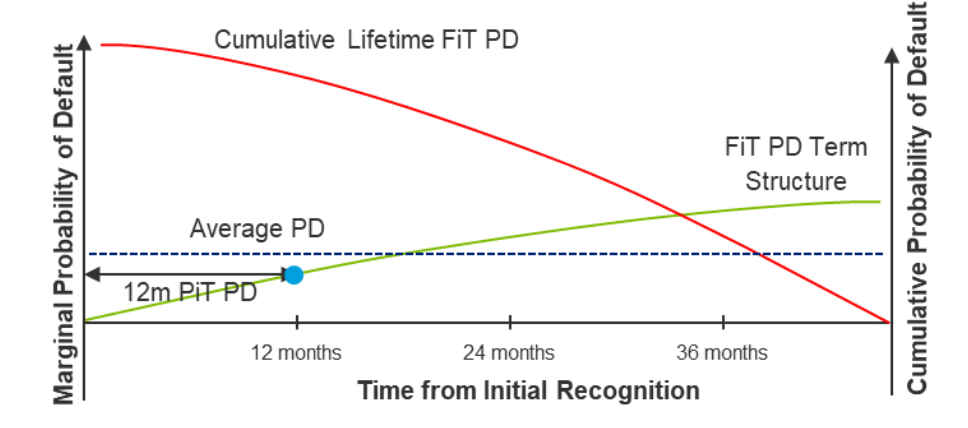

$\text{TTC PD} = \text{PIT PD} - \text{Credit Cycle Adjustment}$


### **Point-in-Time (PIT) PDs** 🟢

The alternative, is a **point-in-time (PIT)** rating system, which produces more **dynamic** PD-estimates that agree more closely with the observed variation in default risk over loan life, as well as incorporate any **temporal macroeconomic effects**. Such dynamicity is perhaps inappropriate for capital estimation since capital levels should preferably not fluctuate wildly over time.

In fact, the introduction of the IFRS 9 accounting standard by the IASB (2014) provided additional impetus for such dynamicity in PD-modelling. Under IFRS 9, a financial asset’s value should be comprehensively adjusted according to a bank’s (evolving) expectation of the asset’s credit risk over time, i.e., the potential loss induced by default.


#### **Term Structure** 🟢

In achieving such dynamicity, and especially for Stages 1-2, risk models need to project default risk ideally over **various time horizons** across loan life and against the changing macroeconomic background. This rather non-trivial task implies the estimation of a marginal (or PIT) PD as a **function of a rich set of input variables**, including macroeconomic covariates. These inputs are measured at each discrete period $t=t_1, ..., T$ during a loan’s lifetime $T$ , starting from its time of initial recognition $t_1$. The collection of these PD-estimates over the lifetime of a
loan is then called the **term-structure** of default risk. 

The term structure is a series of conditional Point-in-Time (PIT) PDs that reflect default probabilities over discrete time intervals (e.g., monthly or annually) for the life of the exposure. This term-structure typically manifests as a non-linear and right-skewed curve over loan life.

Example: Term Structure of 12m-PD over the lifetime of a loan

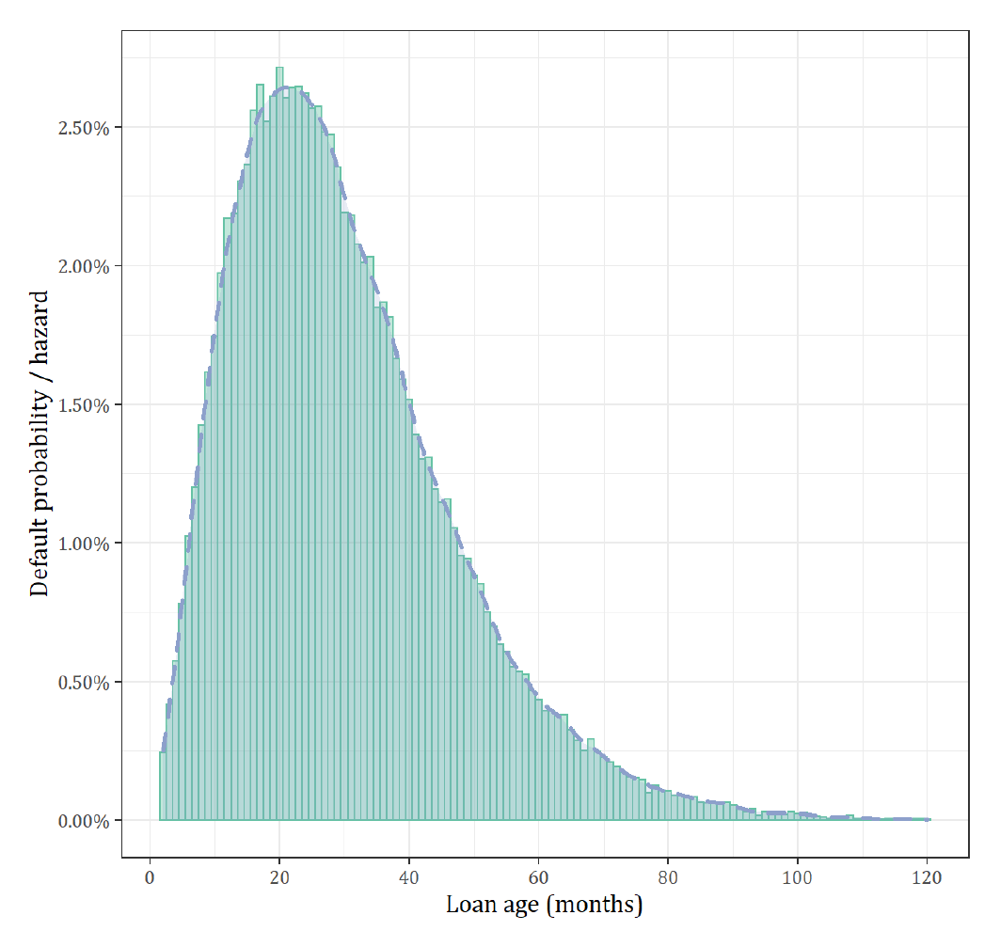

However, there are certain modelling challenges to rendering such dynamic and time-sensitive PD-estimates. Chief among them is due to the fact that ‘default’ is not necessarily an absorbing state into which a loan is forever trapped. If ‘default’ is structured as a transient state during PD-estimation, then one can leverage the full credit histories that are otherwise etched with multiple cycles of curing from default and defaulting again.

Another major modelling challenge arises from the fact that ‘default’ is not the only  ailure-inducing event, despite its importance in credit risk modelling. Other events that may ultimately affect the risk of loss under IFRS 9 include prepayments (or early settlement), write-offs, and restructures. These competing risks will preclude the default-event from occurring, as well as affect the size of the risk set over time. Lastly, default risk is itself a heterogeneous spectrum in that not all loans will have the same PD at the same time point, largely due to differences in the behavioural profiles of borrowers.

##### **Unconditional Marginal PD**

Probability of default that is unconditional on prior 
period default and prepayment.


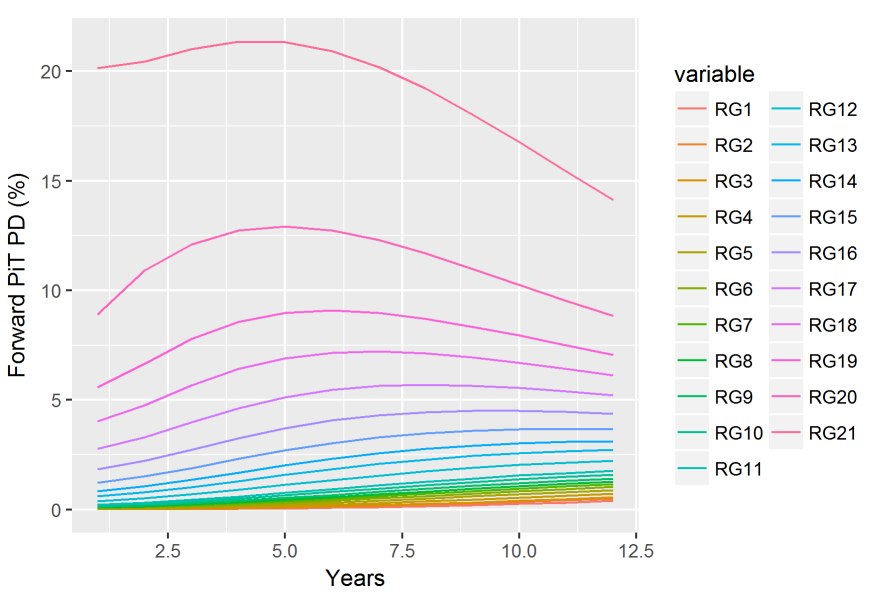

##### **Survival Rate**

A survival rate is required to convert an unconditional PD into a 
conditional PD and is calculated as follows:

$SR_t = SR_{t-1}(1-PD_t^C-PR_t^C)$ where
- $SR_t$ is the survival rate in period t
- $PD_t^C$ is the conditional probability of default in period t
- $PR_t^C$ is the conditional probability of full redemption in period t

##### **Conditional Marginal PDs**

Takes into account survival rate and prior defaults. 

$PD_t^U=PD_t^C \times SR_{t-1}$

For instance:
- A 1-month PD is the probability of default over the first month.
- A 12-month PD is the cumulative probability of default over 12 months.
- A lifetime PD is the probability of default over the remaining life of the asset.

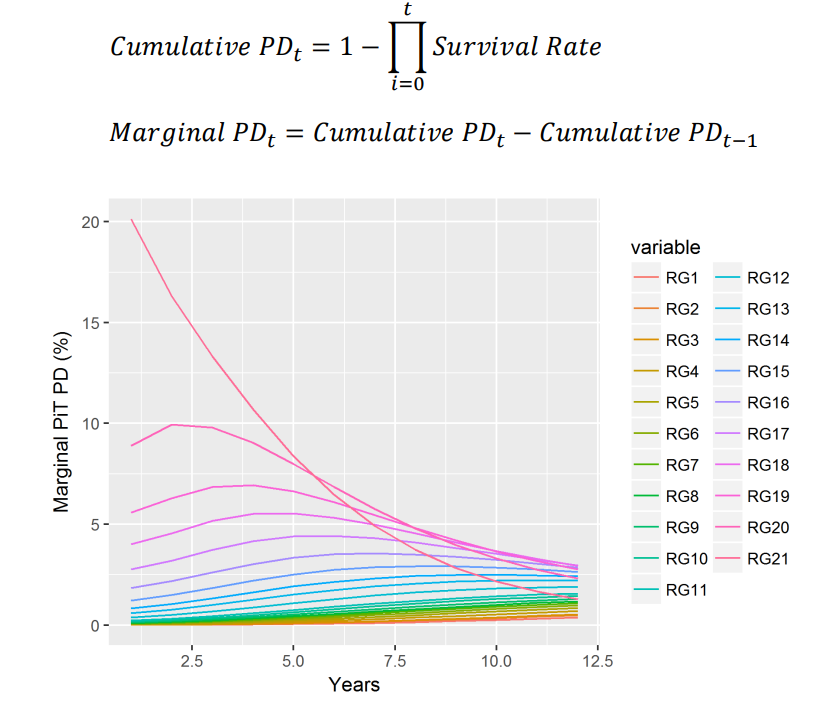

##### **Lifetime PDs**

In facilitating feature engineering and certain comparisons, we require estimates of a loan’s intrinsic default risk over its lifetime. Accordingly, an elementary but typical model is built for predicting this probability of defaulting (PD) over a 12-month period, as applied at any point during loan life. Note that §5.5.9 in IFRS 9 from the IASB (2014)
technically requires the use of a lifetime PD-measure when monitoring default risk over loan life for SICR-purposes, which suggests the use of more sophisticated survival models. 

However, and as allayed in §B5.5.13, a 12-month PD-measure can reasonably approximate its lifetime counterpart when the former captures the most salient of time-dependent default patterns over loan life.

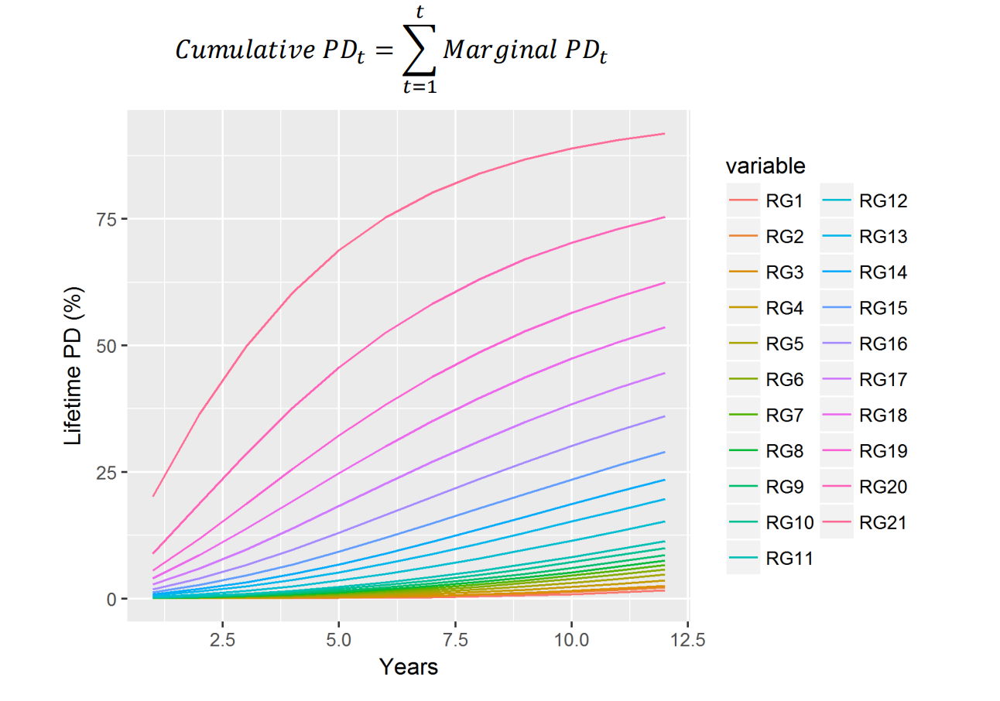

#### **Transient States** 🟢

One class of portfolio-level modelling techniques that can overcome these challenges is that of Markov models, wherein a dynamic phenomenon (e.g., delinquency) is modelled as a stochastic process that depends only on the current state.

As an example, consider the bins: 30 days past due (DPD), 60 DPD, 90 DPD, and 120+ DPD; the last of which serves as an absorbing state that signifies debt write-off. Together with a paid-up/settled state, these delinquency states (or arrears categories) constitute the state space within the transition matrix 𝑇, thereby incorporating all competing risk events. The authors then used Markov theory in estimating the write-off probability (and its variance) towards setting the allowance.

Despite the acclaim of Markov chains, there are two critical assumptions when modelling default risk:

1. That the transition matrix is largely stationary over time
2. That the population is homogenous regarding payment behaviour

##### **Redefaults & Cure**

When calibrating  PDs, accounts that redefault (default after curing) and cure (recover from default) require special treatment to ensure accurate modeling of credit risk dynamics. These events introduce complexities because they alter the time-to-default patterns and can influence the term structure of PDs.

Ignoring redefaults may underestimate the default probabilities for certain risk segments. Overlooking cures may lead to overestimation of default probabilities. 

Include key states in the credit lifecycle. 
- Performing: Accounts with no arrears.
- Curing: Accounts that have recovered from default.
- Defaulted: Accounts in default.
- Redefaulting: Cured accounts that default again.

When preparing the training dataset for PIT PD calibration:
- Separate Redefault Events: Treat redefault events as distinct observations to reflect the elevated risk of these accounts. 
- Include Cure Behavior: Incorporate cured accounts into the dataset, showing their risk of redefault or returning to performing status.
- Track Time Since Cure: Include "time since cure" as a feature, as the likelihood of redefault often decreases the longer an account remains cured.


#### **Time Depedency** 🟢

A nonstationary Markov chain implies a time-dependent transition matrix $T(t')$, where each matrix cell  $T_{kl}(t') = p_{kl}(t')$, itself denoting the estimated transition probability from state $k$ to $l$ between calendar dates $t'_2$ and $t'_1$, represents an element of a broader time series. When modelling such percentage-valued panel data, one can use a class of techniques known as beta regression (BR) models which can incorporate any set of input variables.

#### **Heterogeneity** 🟢

In fully catering for any degree of heterogeneity during PD-modelling, the modus operandi should clearly veer away from directly predicting the portfolio’s aggregate behaviour, and rather towards predicting that of its constituent loans; i.e., loan-level modelling. Within each cell of $T(t')$, either model predicts the corresponding transition probability $p_{kl}(t', x_i)$ given the characteristics $x_i$ of each loan $i$.

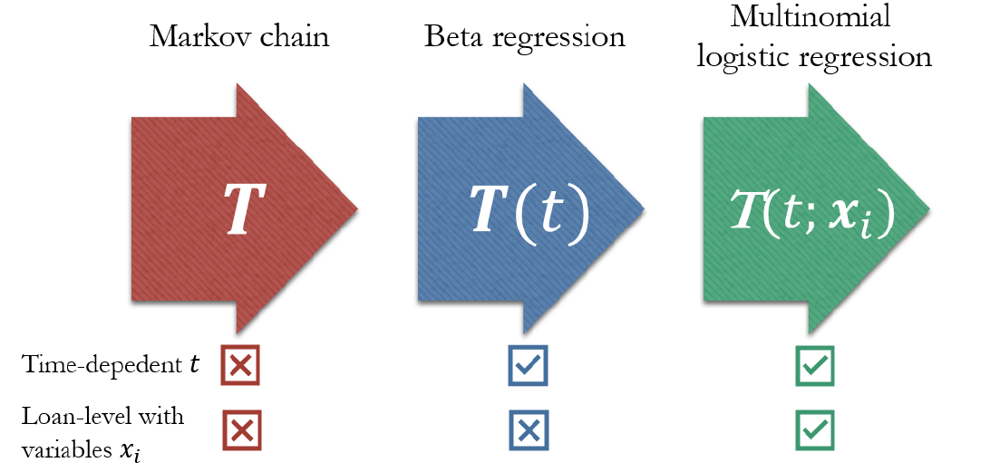

#### **New vs Existing Business** 🟡

The calibration process differs for new business (typically informed by application scorecards) and existing business (typically informed by behavioral scorecards).

Both new and existing business PDs must be adjusted for macroeconomic variables under different scenarios (e.g., GDP, unemployment, interest rates) using models like regression or ML. This creates scenario-weighted PD term structures for base, optimistic, and pessimistic scenarios.



## **EAD (Exposure at Default)**

The outstanding balance or exposure expected at the time of default. Includes principal, accrued interest, and potential undrawn credit lines. The Exposure at Default (EAD) term structure represents the expected exposure at each point in time as a percentage of the credit limit. It accounts for potential changes in exposure due to repayments, credit line utilization, or further drawdowns before default occurs. EAD calibration for IFRS 9 follows a structure similar to Probability of Default (PD) calibration but with a different target variable: the **utilization rate** (drawn balance at default/limit at originating).

$\text{UR}_t = \Large\frac{\text{Drawn Balance}_{D}}{\text{Limit}_{t_0}}$

The data used will be the same used for PDs


### **Secured**

Utilization is easier to model due to predictable repayment schedules and minimal redrawing. Models focus on amortization and collateral impact.

**Segmentation**

Consider collateral effects, loan-to-value (LTV) ratios, and drawdown patterns.

**Utilisation Patterns**

Borrowers tend to draw down large amounts upfront and repay gradually (e.g., mortgages, auto loans). UR often close to 100% initially, decreasing as borrowers repay the principal.

**Repayment Patterns**

Predictable repayment schedules (e.g., fixed monthly payments).


### **Unsecured**

Utilization is dynamic and borrower-driven. Behavioral models and macroeconomic sensitivity are critical.

**Segmentation**

Focus on repayment behavior and utilization trends.

**Utilisation Patterns**

Utilization varies significantly and is often dynamic, with frequent drawdowns and repayments (e.g., credit cards, personal loans). UR varies widely; may start low, increase due to spending, and fluctuate dynamically. 

**Repayment Patterns**

Repayments are more flexible; borrowers may pay minimum balances or draw further. For non-retail exposures, drawings after default also need to be modelled.

**Limit Changes**

They may also increase their limits which will mean you will have to treat the account as a new account given that the behavioural pattern is going to be different. In secured loans like home loans and car loans, changes in the asset's value don't directly affect the credit limit as they do in a credit card scenario. However, the loan-to-value (LTV) ratio and the expected loss given default (LGD) may be impacted.

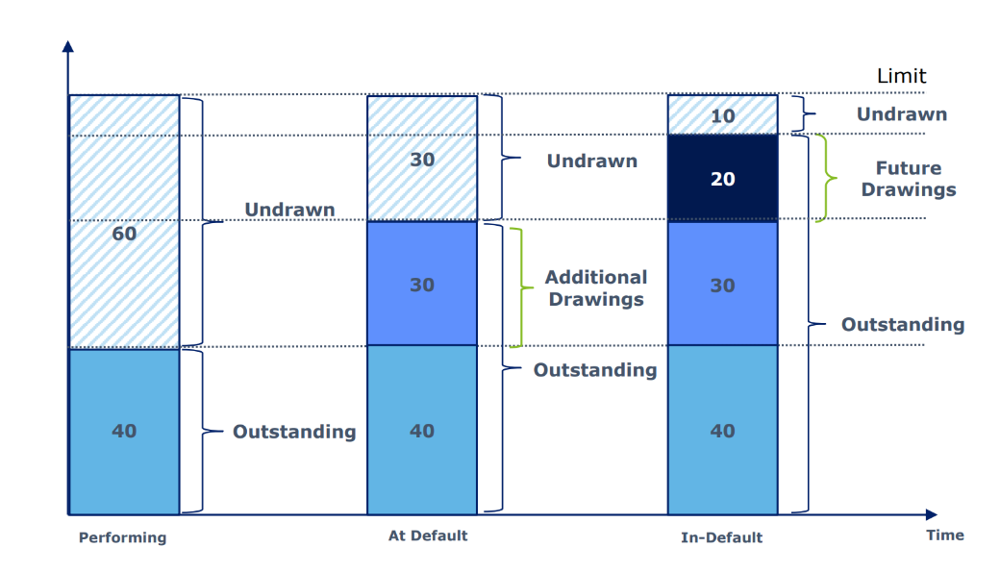

### **Modelling Approaches**

**Historical Averages**

Calculate average utilization rates by segment and time bucket (e.g., 1 month, 3 months, 12 months). Use these averages as a baseline for term structure.

**Markov Chains**

Similar to Markov chains for PD, define states such as:
- Low utilization (e.g., <50%)
- Medium utilization (e.g., 50–90%)
- High utilization (e.g., >90%)

Model transitions between these states over time.

**Supervised Learning**

Predict the utilization rate at future time horizons using features such as:
- Borrower behavior (payment history, historical utilization trends).
- Loan characteristics (tenure, type, interest rate).

Example model: Linear regression, logistic regression (bounded utilization), or tree-based models like XGBoost.

#### **Credit Conversion Factors**

The credit conversion factor is defined as follows:

$\text{CCF}_D = \Large\frac{\text{Drawn Balance}_{D}}{\text{Drawn Balance}_{t_0}}$


## **LGD (Loss Given Default)**

The proportion of the exposure that is expected to be lost if a default occurs. Typically considers collateral and recovery rates. Here's how LGD is modeled, considering Probability of Write-Off Given Default (PWGD) and Loss Given Write-Off (LGW) as well as Loss-Given Cure (LGC) which is mostly the costs associated with debt-collection and counselling.

$\text{LGD} = \text{PWGD} \times \text{LGW} + (1-\text{PWGD}) \times \text{LGC}$

The LGC describes the severity of a loss given that a default cures.
- LGC is typically dependent on the duration of the default
- LGC is typically small and mainly due to costs and delays in the payment

The LGW describes the severity of a loss given that a default does not cure.
- LGW is typically highly dependent on value of collateral
- Borrower characteristics can be used to further discriminate (e.g. industry type)
- LGW can still be zero if collateral coverage is sufficient

A clear distinction can be made between performing and defaulted exposures.

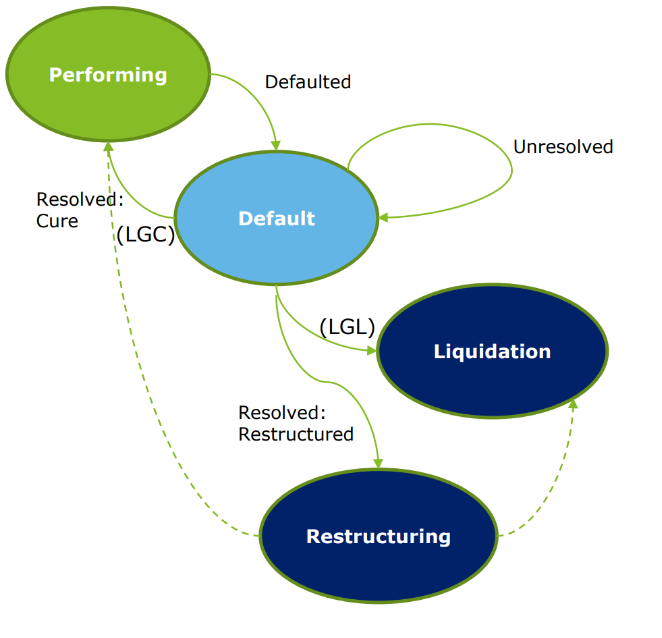

### **Account & Recovery Data (Post-default)**

The dataset for modeling PWGD should track the state of accounts post-default over time. This includes transitions between different states, such as in collections, write-off, and cure. 
- Account ID: Unique identifier for each account.
- Snapshot Date: Date tracking status of the account.
- Default Flag: Identifies if the account is in default.
- Cure Flag: Identifies if the account has cured.
- Write-Off Flag: Identifies if the account has been written off.
- Default Date: Date when the account first entered default.
- Write-Off Date (if applicable): The date the account was written off.
- Current State:
    - In Collections: Actively managed by the recovery team.
    - Cured (Complete): Returned to performing status.
    - Write-Off (Complete): Deemed unrecoverable and written off.
- Balance: Outstanding balance during the collections process.
- Recovery Amounts: Cash recoveries (e.g., partial payments made during collections).
- Exposure at Default (EAD): Initial exposure at the time of default.
- Collection Actions: Actions taken during collections (e.g., restructuring, legal steps).
- Time in Collections: Duration spent in the collections process before cure or write-off.
- Time in Cure: Duration spent in cure


### **Lifetime PWGD** 

The probability that a defaulted borrower will enter a write-off phase given they have defaulted, **eventually**. Unlike PDs, where we look at 12m and lifetime. The in-collections state is a critical phase where accounts are actively managed to either **cure**, **remain in collections**, or move to a **full write-off**. 

$\text{Write Off Rate} = \frac{\text{Written Off Accounts}}{\text{Total Completed Accounts}}= 1 - \text{Cure Rate}$ 

Often modelled similarly to PD using risk drivers that reflect the borrower's repayment capacity and the cure rate tends to decline with increasing time in-default. It is usually modelled by means of a logistic regression (similar to PD).

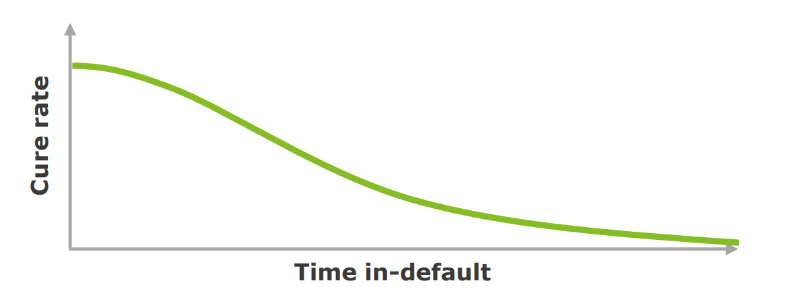

#### **Completion Threshold**

A completion threshold defines the minimum proportion of accounts in a default cohort that have transitioned to a final state (e.g., cured or written off). For example, an 80% threshold means the bank will only analyze cohorts where at least 80% of accounts have reached one of these final states cure or write off (not in collections). Ensures that sufficient transitions have been observed, reducing uncertainty in the model.  Avoids including cohorts with a high percentage of unresolved accounts, which could distort default recovery rates. Provides more reliable and stable transition probabilities for PWGD and LGD modeling.

This is not prescribed by IFRS.

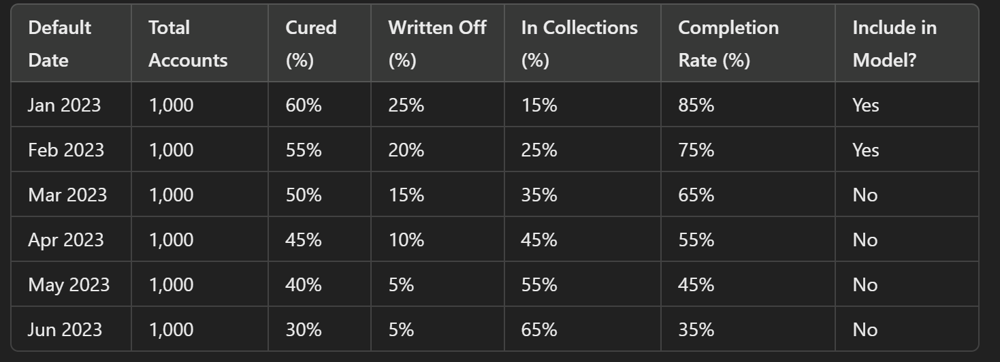

$\text{Completion Rate} = \Large\frac{\text{Written Off or Cured Accounts}}{\text{Total Accounts}}$

#### **Stage 1 & 2 Accounts**

Stage 1 and Stage 2 accounts are typically not in the dataset used for modeling PWGD, as they are still performing or in early stages of credit deterioration. However, they can be modeled using an average lifetime PWGD (an overall write-off rate given default) based on historical patterns of cure and write off for accounts that eventually default (Stage 3).

Calculate the historical write off rate for each deafult date cohort. Then take an average of the historical write-off rates and set it equal to the PWGD assumption for Stage 1 and Stage 2 accounts (fixed probability).

#### **Stage 3 Accounts**

For Stage 3 accounts (which are the defaulted accounts in collections, written off, or cured), the PWGD model needs to account for the time these accounts spend in collections and the likelihood of write-off or recovery over that time. To calibrate PWGD for Stage 3 accounts, build a model (typically a survival analysis model, such as Cox Proportional Hazards or a Logistic Regression model) that predicts the probability of recovery based on the time an account spends in collections **(TIC)**.



#### **Curing Rule**

The curing rule refers to the process by which an account that was previously in default (Stage 3) returns to performing (Stage 1), typically because the borrower has made a **number of sufficient payments** or **resolved the outstanding debt for some time**. 

For Stage 3 accounts, you would track the time spent in collections. This is crucial because the longer an account is in collections, the less likely it is to recover (i.e., the PWGD tends to increase over time). However, what you might notice is that there will be an inital decrease in the PWGD by TIC up until a certain point.

In terms of PWGD, curing affects the likelihood of a defaulted account recovering. This recovery process can be visually represented on a graph showing PWGD by Time in Collection. During the early months of being in collections, the PWGD is often relatively low and possibly decreasing. This is because accounts that defaulted may still have a chance to recover, either through cure or partial payment.

As time in collections increases, the PWGD begins to increase. The likelihood of curing decreases because more time spent in default often indicates more severe financial distress or neglect.

The longer the account stays in collections without curing, the higher the PWGD becomes. This reflects the higher probability of the account being written off or becoming irrecoverable. Accounts that have been in collections for 12+ months often have very low chances of curing, so their PWGD is typically near 100.

The curing rule can be inferred from the point where accounts stop recovering or where a lower PWGD is observed.

### **Lifetime LGW** 

The percentage of the exposure lost during the write-off phase, accounting for recovery efforts. It is is usually calibrated as a function of present value of recoveries (which includes collection costs):

$\text{Loss Rate}=1-\text{Recovery Rate}$

This can be balance weighted (EAD) or number weighted.

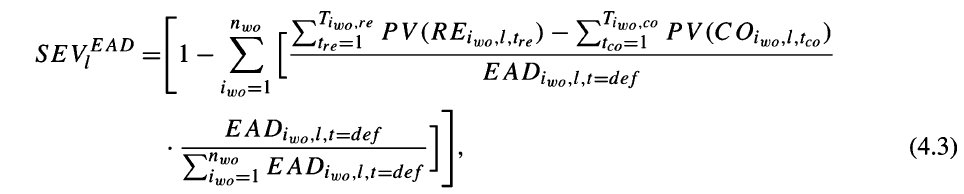

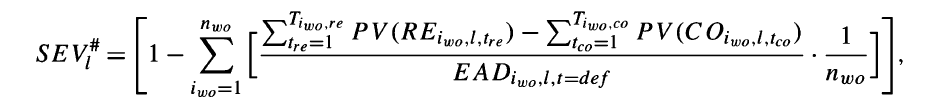

#### **Recovery Curves**

A **recovery rate** is the proportion of the exposure that is expected to be recovered after the default. Longer recovery periods (TIC) can decrease the overall recovery rate. A recovery curve plots (rate vs TIC) are often used to estimate how much of the exposure will be recovered over time. For example, some recovery may occur immediately upon default, and additional recovery might take place through legal actions over a few years.

##### **Secured Loans**

The recovery for secured loans tends to be higher since the bank can sell the collateral (e.g., a house, car, or business asset) to recover part of the defaulted amount. Therefore, the LGW for secured loans will be calibrated based on the expected recovery from the collateral.

This is also usually modelled in two components: 
- Loss for secured part: mostly driven by value of the collateral
- Loss for unsecured part: mostly driven by recoveries

##### **Unsecured Loans**

For unsecured loans (e.g., credit cards), the recovery is typically lower because there is no collateral to recover the outstanding balance. LGWs for unsecured loans are usually modeled based on historical recovery rates from similar loans.

#### **Stage 1 & 2 Accounts**

Similar to the PWGDs, LGWs can be modeled using an average lifetime LGW (an overall loss rate given write-off). Calculate the historical recovery rate for each deafult date cohort. Then take an average of the historical one minus the recovery rates and set it equal to LGW assumption for Stage 1 and Stage 2 accounts.

#### **Stage 3 Accounts**

Similar to the PWGDs, machine learning models or statistical techniques (e.g., regression analysis, survival models) are often used to model the recovery rates for stage 3 loans. Unlike the PWGD term structure you will most likely see a monotonically increasing graph that slows down the furhter in collections it goes.

If you plot the LGW against the write-off date you should get an average rate that should be the average of your LGW curve by TIC. 

#### **PWOR**

Post Write-Off Recoveries refer to the collections or repayments a bank manages to recover from borrowers after their loans have been written off as bad debts. In accounting terms, a write-off occurs when the bank deems that a loan is unlikely to be repaid and removes it from the active accounts receivable or loan book. However, even after a write-off, the bank can continue pursuing recovery actions through legal means, collection agencies, or other strategies.

A loan is written off when the bank believes there is minimal likelihood of full repayment based on its internal policies and regulations (e.g., after a certain period of nonpayment or legal default). The loan balance is removed from the bank's financial statements as an asset. Any recoveries after the write-off are recorded as recovery income in the bank’s income statement, not as a reversal of the write-off.



#### **Write Off Rule**

If banks are recovering a significant portion of bad debts post write-off, it raises questions about the effectiveness and timing of their write-off policy. If a bank writes off loans too early (e.g., before fully exhausting all reasonable collection efforts), it might recover more post write-off. This could indicate overly conservative policies or inefficiencies in pre-write-off collection strategies. This leads to higher than expected LGWs which increases the ECL.

If post-write-off recoveries are consistently high, the bank may need to adjust its write-off criteria to better align with the actual recovery potential. 

## **Forward Looking Information**

In IFRS 9, Forward-Looking Information (FLI) ensures that Expected Credit Losses (ECLs) are not solely based on historical data but also incorporate anticipated macroeconomic conditions (e.g., GDP growth, unemployment rates). The process involves calibrating Point-in-Time (PIT) Probability of Default (PD) values to reflect the influence of future economic scenarios. 


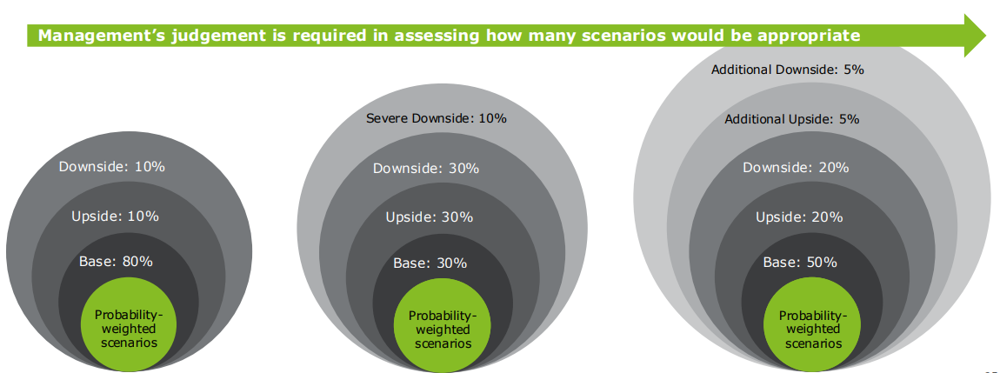

### **Credit Cycle Index**

The credit cycle refers to movements in credit conditions that are shared by a portfolio or 
cohort of borrowers, which vary across the economic cycle. In an ideal world, a credit cycle index is based on internal default data. However, for corporate portfolios this can be particularly difficult as these portfolios tend to have a low number of observed default.


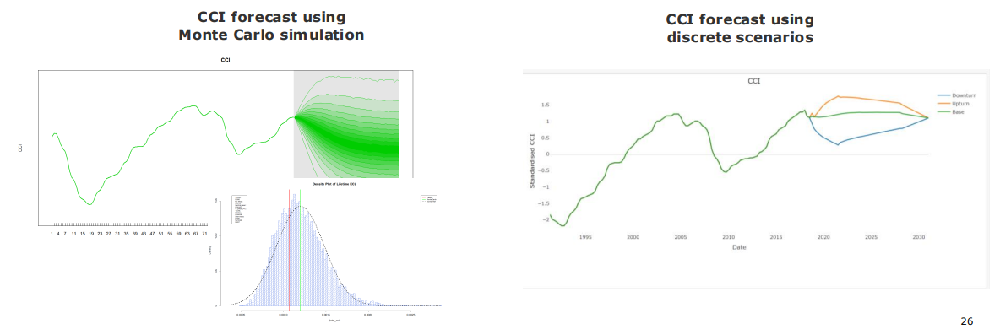


#### **Monte Carlo Simulation**

Monte Carlo (MC) simulation is used to make random draws from a multivariate Normal 
distribution. It can be used to incorporate macro economic forecasts into the ECL models 
to determine whether a banks impairment estimates are within a reasonable range.

#### **Discrete Scenarios**

### **PD**
Use a statistical model (e.g., linear regression, logistic regression) to link historical default rates to macroeconomic factors. A model can be regressed for all outcome periods (1m, 2m, ... etc). Normally in an audit only the 12m is looked at typically. The lifetime will be the same as the FLI PD since it averages out.

$y=\text{Average Default Rate}_{12m}=\beta_0+\beta_1\text{GDP Growth}_{12m}+\beta_2\text{Interest Rate}_{12m}+\Epsilon$

Standard normalization involves transforming a variable so that it has a mean of 0 and a variance of 1. This transformation is common in regression and machine learning models to ensure that all variables are on a comparable scale, making coefficients more interpretable and improving numerical stability.

Given a macroeconomic variable X (e.g., GDP growth, inflation rate), the standardized value Z is computed as:

$Z=\Large\frac{X-\mu_X}{\sigma_X}$

Removes the original unit of measurement (e.g., percentages or absolute values) for easier comparison across variables.

The regression identifies the sensitivity of PDs to each macroeconomic variable. With calibrated coefficients, obtain **forecasts** for macroeconomic variables for each future time period under:
- Baseline Scenario: Expected economic performance.
- Upside Scenario: Optimistic economic conditions.
- Downside Scenario: Pessimistic economic conditions.

Plug the forecasted macroeconomic variables into the regression model to estimate future default rates under each scenario. Example:
- Baseline PD: 4.5%
- Upside PD: 3.8%
- Downside PD: 5.7%

If you plus in 0 for the variables you should end up with your PD equal to $\beta_0$ (the intercept). This should be equal to the historical TTC PD since all the macroeconomic variables are at their averages. 

Calculate the ratio or FLI adjustment factor for each scenario by comparing forward-looking PDs to historical or baseline PDs.

$\text{Factor } X=\Large\frac{\text{FLI-Adjusted PD Scenario }X}{\text{Base PD}}$

Multiply the base PDs (calibrated without considering macro factors) by the FLI adjustment factor.

$\text{PD}_X = \text{Base PD} \times \text{Factor } X $

Weight the adjusted PDs across scenarios using their assigned probabilities

$\text{Weighted PD}=(\text{PD}_{\text{baseline}}\times 50\%)+(\text{PD}_{\text{upside}}\times 20\%)+(\text{PD}_{\text{downside}}\times 30\%)$


The best way to test a FLI model is to plot its expected PDs against the historical default rates and using a visual test to see if the **peaks** and **trophs** are aligned.

### **LGD**

## **EIR Discounting**

ECL is the present value of expected cash shortfalls. Use the effective interest rate (EIR) of the financial asset to discount future losses to their present value. The Effective Interest Rate (EIR) is the internal rate of return (IRR) on the expected future cash flows of a financial instrument over its life, accounting for:
- **Contractual Interest Rate**: The nominal interest rate stated in the loan agreement.
- **Transaction Costs**: Fees directly attributable to the acquisition or issuance of the financial instrument (e.g., initiation fees).
- **Other Adjustments**: Any premiums, discounts, or deferred fees.

The EIR is derived by solving the following equation:

$\text{Initial Loan Amount} = \Large\Sigma_{t=1}^n\frac{\text{CF}_t}{(1+\text{EIR})^t}$
- $\text{CF}_t$ The expected cash inflows/outflows (e.g., interest payments, principal repayments, fees).
- $\text{Initial Loan Amount}$ The net amount disbursed to the borrower after fees and costs.

Use numerical methods (e.g., Newton-Raphson method or financial software) to find the discount rate (EIR) that equates the present value of future cash flows to the initial loan amount. The EIR is found to be approximately higher than the contractual rate due to the initiation fee.

Reflects the true cost of borrowing or yield on lending. Allows borrowers or investors to compare financial instruments with different fee structures or terms.

## **Impairment** 

Under IFRS 9, impairment is a dynamic, forward-looking calculation that incorporates staging, probability-weighted losses, and macroeconomic scenarios. Its impact is reflected through a loss allowance on the balance sheet and impairment charges in the P&L. This ensures that the financial statements present a more accurate and timely view of credit risk. The calculated ECL is recorded as a loss allowance on the balance sheet. 



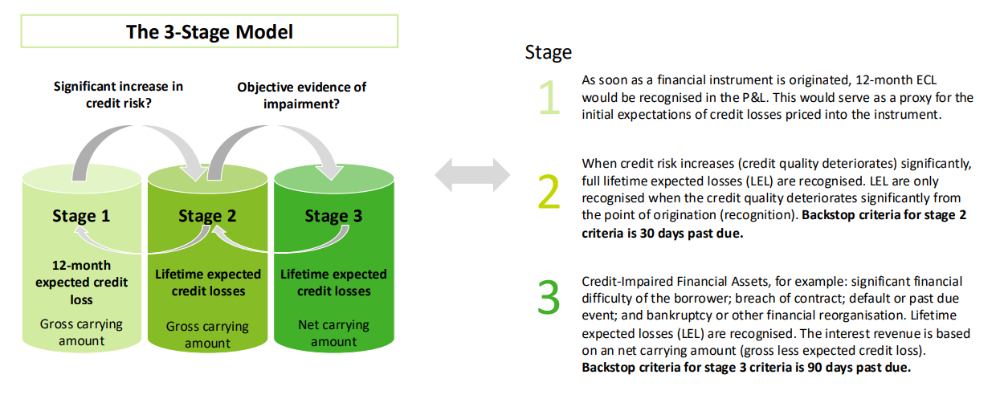

### **Gross Carrying Amount**

The gross carrying amount of a financial asset under IFRS 9 represents its original or amortized cost, before any adjustments for impairment losses (i.e., loss allowances). It reflects the contractual amounts due from the borrower and excludes any deductions for expected credit losses.

The gross carrying amount includes:
- Principal Outstanding: The unpaid balance of the loan or credit facility.
- Accrued Interest: Any interest income that has been earned but not yet received.
- Transaction Costs (for amortized cost assets): Costs directly attributable to issuing or acquiring the financial asset.
- Amortization: Adjustments made due to the effective interest rate (EIR) method.

For stage 1 and stage 2 accounts, interest revenue is still calculated on the gross carrying amount.

### **ECL**

The gross carrying amount is primarily used to calculate the loss allowance for expected credit losses as well as the net carrying amount shown on the balance sheet.

$\text{ECL} =\text{GCA}_{t=0} \displaystyle\sum_{n=1}^{12} \text{PD}_{n} \times \text{LGD}_{n} \times \text{EAD}_{n} \times (1+\text{EIR})^{-n}$

Quick check: if discount rate increases then ECL should get bigger since it is negative.



### **Net Carrying Amount**

The financial asset is shown at its net carrying amount:

$\text{Net Carrying Amount} = \text{Gross Carrying Amount} - \text{ECL}$

Changes in the ECL (e.g., new impairments or reversals) are recognized as impairment charges in the income statement. 

For Stage 3 accounts, interest revenue is calculated on the net carrying amount (gross amount minus loss allowance).



### **Coverage Ratio**

A coverage ratio is a financial metric used to assess an entity's ability to meet its financial obligations, such as debt repayments, interest expenses, or other liabilities. In an IFRS9 context it is the ECL over the total outstanding loan amounts.
Investors use this to compare companies and it is used to see if the book is getting better or worse. But could be also used to see if a change in strategy has worked or will work.

Usually is grouped by new business vs existing business and on the new busienss side it is used to see if any updates to an application scorecard are working.


## **SICR** 🟢

Under IFRS 9: Financial Instruments, the concept of a Significant Increase in Credit Risk (SICR) is a critical component of the impairment model. It requires financial institutions to assess whether the credit risk of a financial asset has significantly increased since its initial recognition. If there is a SICR, the asset transitions from Stage 1 to Stage 2 in the Expected Credit Loss (ECL) framework. This increases the ECL since we are now using a lifetime PD and EAD. 

The IFRS 9 standard does not prescribe a single method for determining a SICR but provides principles and guidelines. IFRS 9 allows institutions to design their SICR framework, which introduces variability across entities. 


Factors to consider the occurence of SICR includes, but is not limited to:
- Quantitative indicators: PD comparison where a residual lifetime PD should used. It implies that the same remaining period is considered for PD at origination and reporting date. As a proxy, a 12m PD can be used if changes in a 12m PD are a reasonable approximation to changes in a lifetime PD.
- Qualitative indicators: IFRS 9 provides some examples such as credit spread, CDS price etc. These factors should considered separately as they are not included in the quantitative assessment.


### **PD Comparison Approach** 🟢

Let this $t$-month PD be denoted by $p_{t}(x_i,t')$ given risk information $x$ observed at time $t'$ for a specific loan account. A SICR-event can then be defined by comparing $p_1(x,t'_r)$ with $p_1(x,t'_i)$ between reporting time $t'_r$ and initial recognition time $t'_i$ , which reflects §5.5.9 in IFRS 9. An accounted is SICR if there is a significant increase in the current FLI-adjsuted PD compared to the initial application PD (regardless of how it changed in between). 

Should this change in risk estimates, or the magnitude $m(x,t'_r)$, exceed some arbitrarily chosen threshold $u$, then a SICR-event is said to have occurred. Note that $m(x,t'_r)$ can refer either to the difference $p_1(x,t'_r) -p_1(x,t'_i)$, or to the ratio $p_1(x,t'_r)/p_1(x,t'_i)$; though both definitions signify the change in lifetime PD. $m(x,t'_r) > u$, then the loan is migrated to Stage 2, otherwise it remains in Stage 1. Given any 𝑢-value, we subsequently formulate this approach into
the binary-valued decision model $H(𝑚, 𝑢) ∈ {0, 1}$

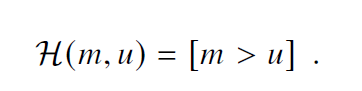

The converse is presumably true as well: a Stage 2 loan is migrated back to Stage 1 once its risk has improved, i.e., if $m(x,t_r'')\leq u$ at some future time $t_r''> t_r'$ . Doing so would be cost-efficient, particularly since overzealous Stage 2 classification can become prohibitively costly, even if risk-prudent.


This approach immediately highlights at least two challenges in establishing whether credit quality has deteriorated significantly. 
1. Selecting an appropriate threshold for the magnitude is non-trivial and highly subjective, which is exacerbated by IFRS 9 being principled instead of overly prescriptive. Neither IFRS 9 nor most regulators offer any firm guidance on the choice of $u$. While the European Banking Authority defines $u = 200\%$, it provides no explanation for this seemingly arbitrary value. In fact, the PRA observed multiple threshold-values that were in use across UK banks and even across different portfolios; all of which attests to further arbitrariness.
2. Secondly, any reliance on the point estimate PD tacitly requires a certain degree of accuracy. Examples: inappropriate
modelling technique, failing to capture the time-dynamic nature of lifetime PD, selecting good predictive variables, data quality, paucity of data for low default portofolios.

The UK-regulator is unsurprised by these differences in SICR-classification, presumably due to the underlying differences across banks in their risk appetites, strategies, and portfolio compositions. 

https://www.pwc.com/gx/en/audit-services/ifrs/publications/ifrs-9/ifrs-9-impairment-significant-increase-in-credit-risk.pdf


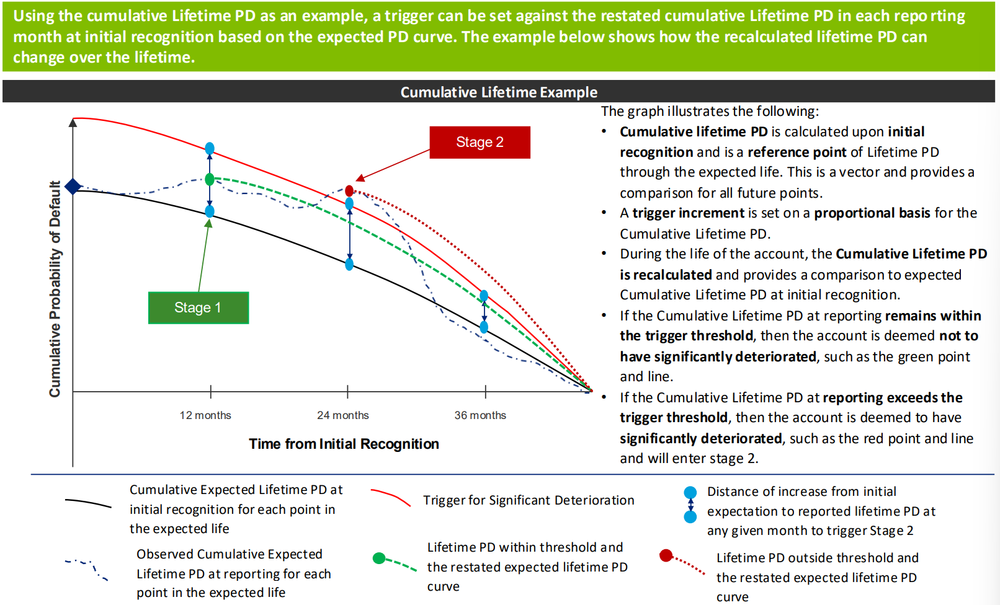

#### **Threshold Options**

The requirement for the use of significant deterioration requires a methodology to both define what is “significant” and identify a 
trigger process to apply the deterioration. The application and identification of these triggers has not yet been established in the 
industry. However, there are a number of ways being considered.

There are a number of approaches that can be used to apply the thresholds and triggers for an increase in credit risk using a Lifetime 
PD. Based on a simple total lifetime PD by grade, the following are examples identifying the PD Trigger:
- Absolute
- Fixed
- Proportional
- Combination

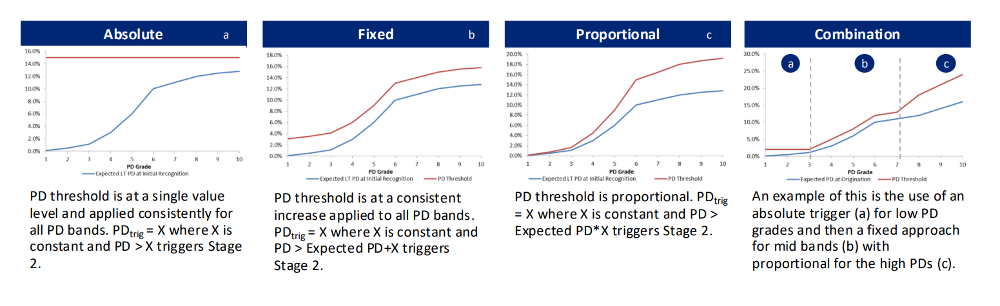

#### **Boundary Calibration**

The selection of boundary between Stage 1 and Stage 2 is a special case of a scientific problem that has existed since at least the development of Radar in the 1930s. The problem of “is it a bird, or is it a bomber” is also encountered in many medical and scientific applications. Optimal separation of birds and bombers requires calibration of a threshold which minimises the Mean Square Error.

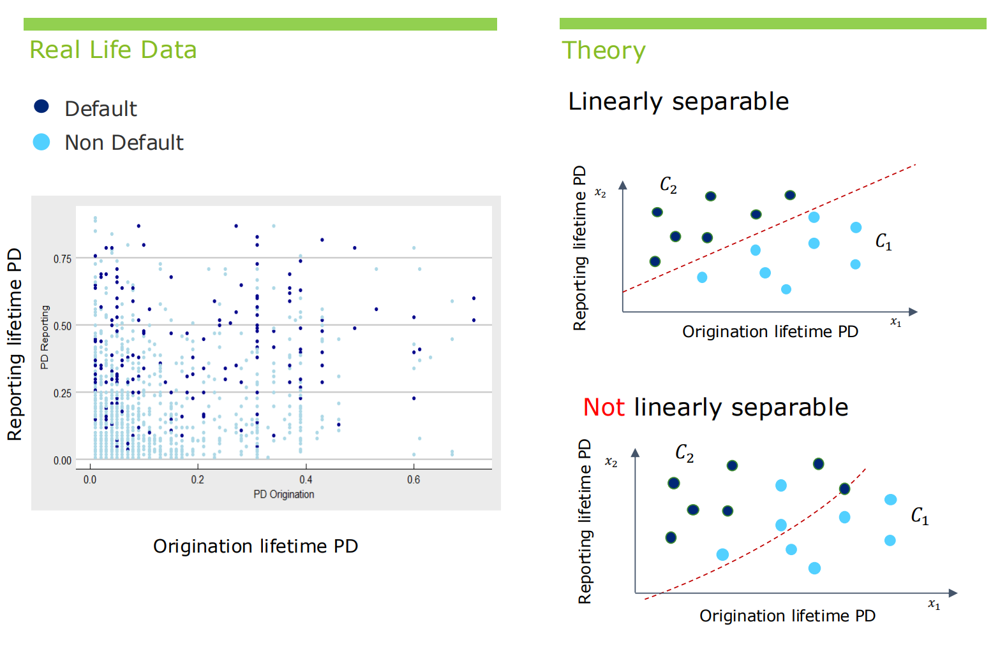

#### **Forward Roll Rates** 🟢

Some banks select $u$ such that the SICR-flagged population constitutes a pre-defined % of the portfolio, where the percentage is based on the observed transition rate (**roll rate**) of becoming delinquent, i.e., reaching 30 days past due (Stage 1 to Stage 2). Roll rates offer a dynamic and quantitative way to model credit risk and inform SICR criteria. Roll rates represent the probability of a loan transitioning from one delinquency bucket to another over a specified time horizon.  

You can plot these roll rates historically to determine an average roll rate and use that to inform what % of your portofolio should be SICRed. 


You determine the transition probabilities between delinquency buckets over the last 12 months lets say. If 10 out of 100 loans in the "current" bucket transition to the "1–30 days past due" bucket, the roll rate is 10%. At the reporting date, we then will move 10% of the accounts. But the question then becomes which accounts do we move? This is then up to the individual banks to look at other variables such as:
- Change in orgination vs current PDs
- Number of other loans
- Performance on other loans

A good example is if you have a home loan and a credit card. If you were to miss a payment it would be on your credit card since missing payments on your home could lead to repossesion. Hence, you would be SICRed on your home loan ECL should you miss payments on your credit card.

While certainly simple, this method suffers from at least three major drawbacks.

1. The precise way in which the roll rate is calculated can adversely affect the chosen $u$-value, if done incorrectly. Some notable risk factors include both the length and recency of the underlying sampling window, which may be inappropriately short or exclude known periods of macroeconomic distress. 
2. Targeting any % presumes that the delinquent proportion of a portfolio will itself remain largely static in future. This rather crude assumption surely cripples the risk-sensitivity of SICR-classification, especially so during times of macroeconomic upheaval, precisely when SICR-classification should have been dynamic. 
3. Stakeholders commonly disagree when adjusting this %-value across different macroeconomic scenarios, which
renders the eventual $u$ value as highly subjective and possibly divorced from reality.






### **SICR Modelling** 🟢

The basis of ‘SICR-modelling’ is then finding a statistical relationship between future SICR-events and a broad set of present-day inputs that predict those SICR-events. Such a binary classification task can render SICR-predictions more accurately, which includes the change in risk since initial recognition; i.e., the magnitude $m(x, t_r)$.

In fact, IFRS 9 already requires the use of "all reasonable and supportable information" to identify a SICR-event (cf. §5.5.4, §5.5.9, §5.5.11, §5.5.17), which further supports statistical modelling.

It is not strictly necessary to compare explicit PD-estimates at two points, provided that the evolution of default risk over time is incorporated in some other way. In principle, and when viewed retrospectively, a SICR-event should reasonably preempt a default event such that the **timings of both events do not coincide**, lest we contravene §B5.5.21. This principle suggests using loan delinquency (and its pre-default evolution) directly in defining a SICR-event, at least retrospectively. 

#### **SICR Indicators**

In defining a SICR-event, one can compare the deliquency measure $𝑔_0(𝑡)$ at time 𝑡 against a specifiable threshold 𝑑. In fact, delinquency can be tested over multiple consecutive months, thereby ensuring that a ‘true’ SICR-event is eventually identified at 𝑡. Such a preliminary SICR-event is said to have occurred at time 𝑡 if $𝑔_0(𝑣) ≥ 𝑑$ holds true across a fixed time span $𝑣 ∈ [𝑡 − (𝑠 − 1), 𝑡]$. The specifiable
parameter $𝑠 ≥ 1$ is the number of consecutive months for which delinquency is tested; put differently, 𝑠 is the **stickiness** of the aforementioned delinquency test. These ideas are formalised within the Boolean-valued decision function $G(𝑑, 𝑠, 𝑡)$ that yields a binary-valued SICR-status in defining a SICR-event at an end-point 𝑡, expressed as:

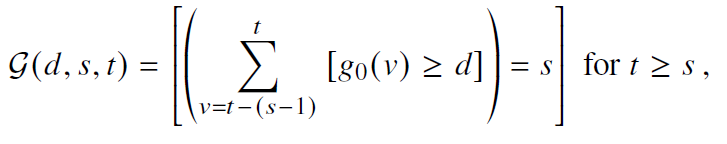

where [𝑎] are Iverson brackets that outputs 1 if the enclosed statement 𝑎 is true and 0 otherwise. The 𝑠-parameter simply smooths away rapid 0/1-fluctuations in the SICR-status over time, thereby becoming ‘sticker’ as 𝑠 increases.

The loan’s resulting binary-valued SICR-statuses, i.e., its $G(𝑑, 𝑠, 𝑡)$-values, can now be used within a typical cross-sectional modelling setup for predicting future SICR-events, or SICR-outcomes.

In preparing the modelling dataset, we observe all predictive information of loan $𝑖$ at a particular time 𝑡. Then, the loan’s future SICR-status at time $𝑡 + 𝑘$ is merged to the observations at 𝑡, thereby taking a snapshot between two points in time, or a cross-section. However, the chosen value for this third parameter $𝑘 ≥ 0$ (or outcome period) can significantly affect modelling results.

More formally, a process $Z_𝑡 (𝑑, 𝑠, 𝑘) = G(d,s,t+k)$ prepares a given loan’s monthly performance history by evaluating G at ‘future’ time $𝑡 + 𝑘$, though assigns the result to time 𝑡

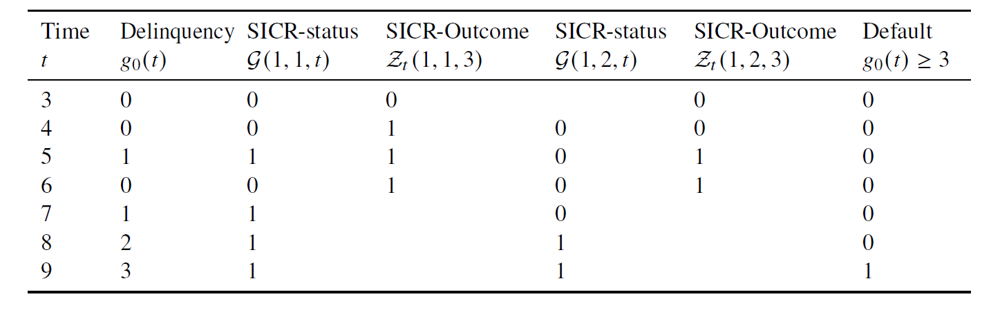

Various SICR-definitions are generated using the $Z_𝑡(𝑑, 𝑠, 𝑘)$-process simply by systematically varying its parameters $(𝑑, 𝑠, 𝑘)$.

The parameter space includes: 1) the threshold 𝑑 ∈ {1, 2} of $𝑔_0$-measured delinquency beyond which SICR is triggered; 2) the level of stickiness 𝑠 ∈ {1, 2, 3} within the delinquency test; and 3) the choice of outcome period 𝑘 ∈ {3, 6, 9, 12} when modelling SICR-outcomes. While the parameter spaces of 𝑑 and 𝑠 are appreciatively small, the same luxury does not hold for the outcome period 𝑘, which can indeed assume many values.

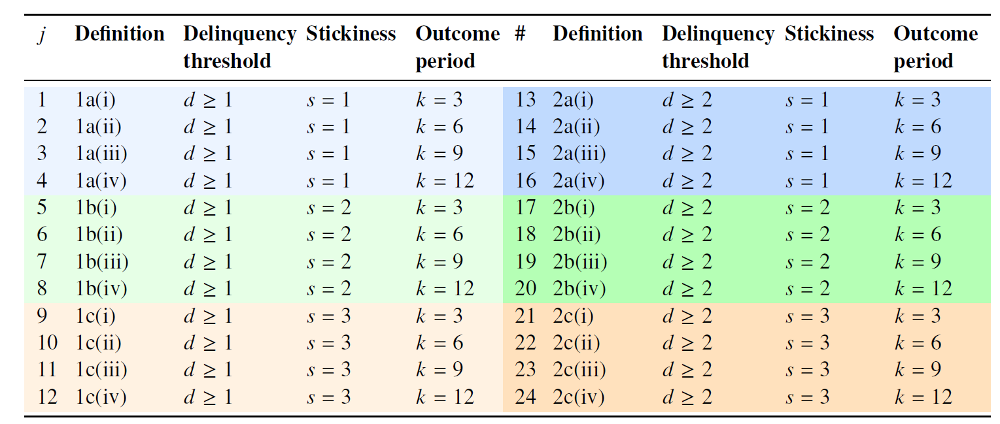

Each entry in the table can serve as a particular target definition in building a corresponding SICR-model using some technique.

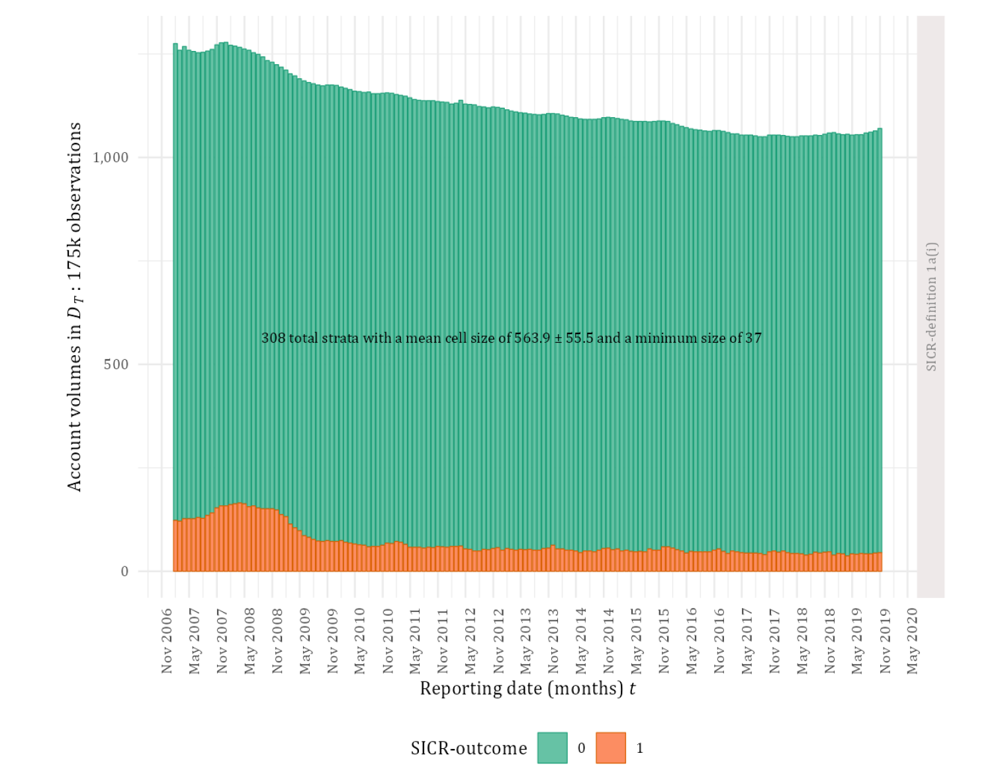

#### **Binary Logistic Regression**

Our chosen chosen modelling technique is binary logistic regression, given its ubiquity in credit risk modelling. Each resulting logit-model will therefore yield a probability score for a particular account at each point during its lifetime. These 𝑘-month forward SICR-predictions reasonably approximate their true lifetime counterpart, which can admittedly only be rendered by using more dynamic/complex modelling techniques, e.g., survival analysis.

In predicting the SICR-outcomes $𝑦_{𝑖𝑡}$ for each outcome period, consider the raw dataset D as a realised vector of input variables. These variables are thematically grouped as follows:
1. account-level information $𝒙_𝑖$ for loan 𝑖, e.g., repayment type (debit order, cash);
2. macroeconomic information $𝒙_𝑡$ at time 𝑡, e.g., the prevailing inflation rate;
3. time-dependent behavioural information $𝒙′_{𝑖𝑡}$ , e.g., the time spent in a performing spell, or the PD-ratio that signifies the change in default risk since initial recognition.

Here we are trying to model the **conditional SICR probability**.

The probabilistic SICR-predictions from logit-models will need to be dichotomised towards rendering impairment staging decisions under IFRS 9, i.e., Stage 1 or 2, which are respectively called a ‘negative’ or
‘positive’ event. An appropriate cut-off c ∈ [0, 1] is therefore required for dichotomising each probability score 𝑝 ∈ [0, 1] from each SICR-model 𝑗. 

Moreover, SICR-outcomes are relatively rare and the consequences of misclassifying positives vs. negatives are intuitively unequal. Under IFRS 9, false negatives 𝐹− should be costlier than false positives 𝐹+ in that the former implies the bank has failed to increase its loss provision for those accounts with increasing credit risk, i.e., those accounts with an actual future SICR-outcome. Misclassification costs are accordingly assigned as $𝑐_{𝐹-}$ = 6 for false negatives and $𝑐_{𝐹+}$ = 1 for false positives, which implies an intuitively high cost ratio of 𝑎 = 6/1 across all SICR-models. 

These costs are deduced using expert judgement and experimentation, though can certainly be refined in future work. Given this 𝑎-value, each 𝑐-value is then found using the Generalised Youden Index.

Finally, each SICR-model is dichotomised into the discrete classifier ℎ that yields the class prediction $ℎ(𝒙_𝑖) = 1$ if $𝑝(𝒙_𝑖) > 𝑐$ and $ℎ(𝒙_𝑖) = 0$ otherwise.

#### **Feature Selection**

Selecting viable input variables within each SICR-model is mainly achieved by using iterative logistic regressions, often grouped into various mini-themes in distilling insight. This interactive process is guided by experimentation, expert judgement, model parsimony, statistical significance, macroeconomic theory, goodness-of-fit, and prediction
accuracy. Note that in this work, we are ultimately examining the effect of a particular SICR-definition within a broader multi-definition setup. 

Therefore, and as a last step, the selected features are ‘standardised’ within each definition class in the table such that all SICR-models have the same input space per (𝑑, 𝑠)-tuple across all 𝑘-values. This ‘standardisation’ should not be confused with rescaling some quantity towards achieving zero mean and unit variance. By standardising the input space, one can therefore ascribe observable patterns in model performance
only to variations in the SICR-definition itself, without contending too much with changes in the input space.

>"Furthermore, the variable `pd_ratio` signifies the change in the lifetime PD since initial recognition, which ensures compliance with §5.5.9 of IFRS 9. Our results, however, show that this variable is statistically insignificant across all SICR-definitions, which implies that the broader input space already captures whatever intrinsic information this variable might have in predicting future SICR-events. This profound result clearly rebuts the underlying intuition of §5.5.9 on incorporating the lifetime PD when rendering SICR-flagging decisions. However, this result is also unsurprising since the associated PD-model  has an input space that is similar (but smaller) to those of the various SICR-models. Therefore, not only do these SICR-models predict future SICR-events more accurately, but they also do so more parsimoniously than the PD-comparison approach."

#### **Outcome Period 𝑘**

In general, SICR-classification should react dynamically to changes in credit risk and its pre-default evolution over time. This dynamicity is even implicit in §B5.5.2 of IFRS 9, which postulates that a SICR-event should ideally predate an increase in loan delinquency, i.e., the $𝑔_0$-measure. In predicting such events, shorter outcome periods 𝑘
can demonstrably achieve this dynamicity more readily than longer periods, since the latter is at greater risk of missing short-term fluctuations in $𝑔_0(𝑡)$ between times 𝑡 and 𝑡 + 𝑘. 

However, the ‘optimal’ choice of this outcome period is yet unclear, as is the very idea of optimality within this SICR-modelling context. To help fill this gap, we deliberately vary 𝑘 from 3 months up to an extreme of 36 months when training our cross-sectional SICR-models,
at least within this particular subsection. 

Aside from the 𝑘-parameter, the two other parameters are kept constant at 𝑑 = 1 and 𝑠 = 1, which resolves to definition class 1a within the table. These two values are relatively benign for the following two reasons. Firstly, the underlying SICR-test $𝑔_0(𝑡) ≥ 𝑑$ suggests that 𝑑 = 2 will yield a subset of SICR-outcomes that are already selected by 𝑑 = 1. 

Secondly, 𝑠 = 1 implies zero ‘stickiness’ and simplifies the
resulting SICR-definition. Both choices of 𝑑 and 𝑠 should therefore have minimal interference when studying the effect of 𝑘, as intended.

In exploring the portfolio-level effect of a given SICR-definition, one may start by examining the actual SICR-rate; i.e., the Stage 2 transition/delinquency rate over a 𝑘-month period.

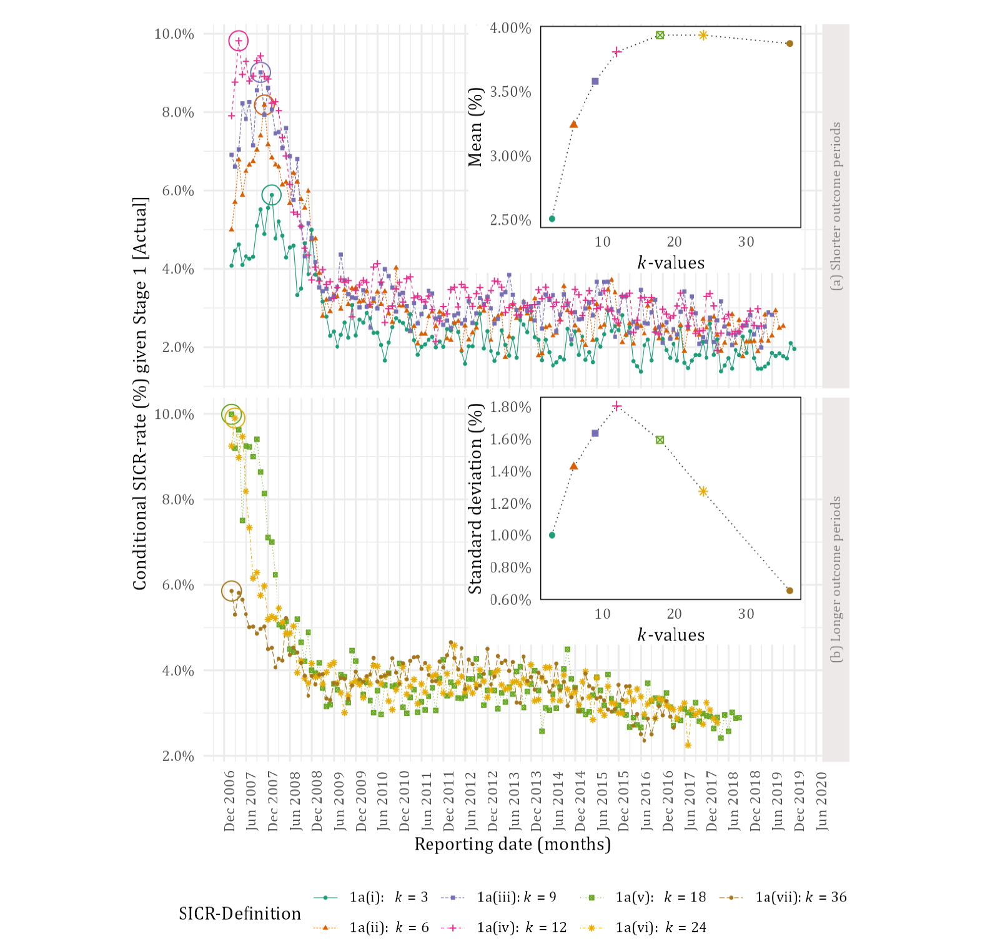

Each SICR-rate has a different but increasing mean-level as 𝑘 increases, especially when examined after the anomalous 2008 Global Financial Crisis (GFC). Since $𝑔_0(𝑡 + 𝑘) ≥ 3 > 𝑑$ will hold for both default and SICR-outcomes, larger 𝑘-values will increasingly capture a greater proportion of defaulting accounts, thereby explaining the phenomenon.

Moreover,teh figure reveals a plateauing effect in the mean, which suggests that choosing $𝑘 ≥ 18$ has a negligible contribution to the overall SICR-mean. At worst, choosing $𝑘 ≥ 18$ will increasingly select
default-instances into the sample, thereby ‘contaminating’ the SICR-mean. Doing so can detract from the very idea of SICR-staging, which should ideally act as a pro-cyclical early warning system for impending credit risk; see §B.5.5.21 in IFRS 9 from IASB (2014). The SICR-rate of each 𝑘-value also exhibits a unique volatility pattern, which is seemingly more stable at the extremes, i.e., $𝑘 ≤ 3$ and $𝑘 > 24$. However, stable SICR-rates may not necessarily be a useful pursuit, especially not during an unfolding macroeconomic crisis and its subsequent effect on default rates. In particular, the most stable SICR-rates also failed to track the increasing default rates during 2007-2008. 

As a working principle for defining the SICR-event, SICR-rates should reasonably exceed default rates since SICR-staging should ideally preempt default. This principle avails a useful heuristic in disqualifying both $𝑘 ≤ 3$ and $𝑘 > 24$, given their failure in tracking the 12-month default rate.

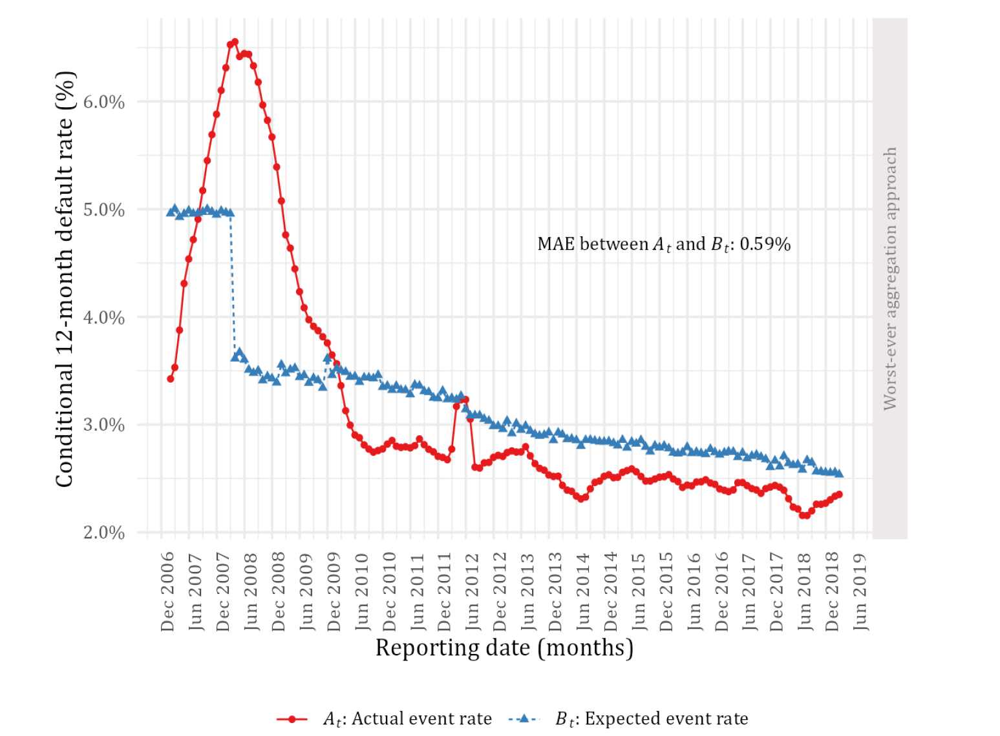

Consider then the portfolio-level 12-month conditional default probability, both time graphs should ideally overlap with each other quite closely, thereby suggesting that the aggregated predictions agree with reality. The early peak in $𝐴_𝑡$ clearly signifies the 2008-GFC, while $𝐵_𝑡$ reacts at least moderately in its prediction of the
prevailing default rates. Aside from the anomalous 2008-GFC, the prediction $𝐵_𝑡$ evidently exceeds the actual default experience $𝐴_𝑡$ across the majority of periods, which is reassuringly risk-prudent.

The actual SICR-rates per 𝑘-value can be further examined on the basis of various summary statistics, i.e., the earliest 𝑎(𝑘), the maximum 𝑏(𝑘), and the post-2008 mean 𝑐(𝑘). We define two elementary statistics as: 

1. The early warning degree 𝑏(𝑘) − 𝑎(𝑘), which denotes the degree to which a SICR-rate can respond to unfolding calamities
2. The recovery degree 𝑏(𝑘) − 𝑐(𝑘), which measures the magnitude by which the SICR-rate can normalise post-crisis.

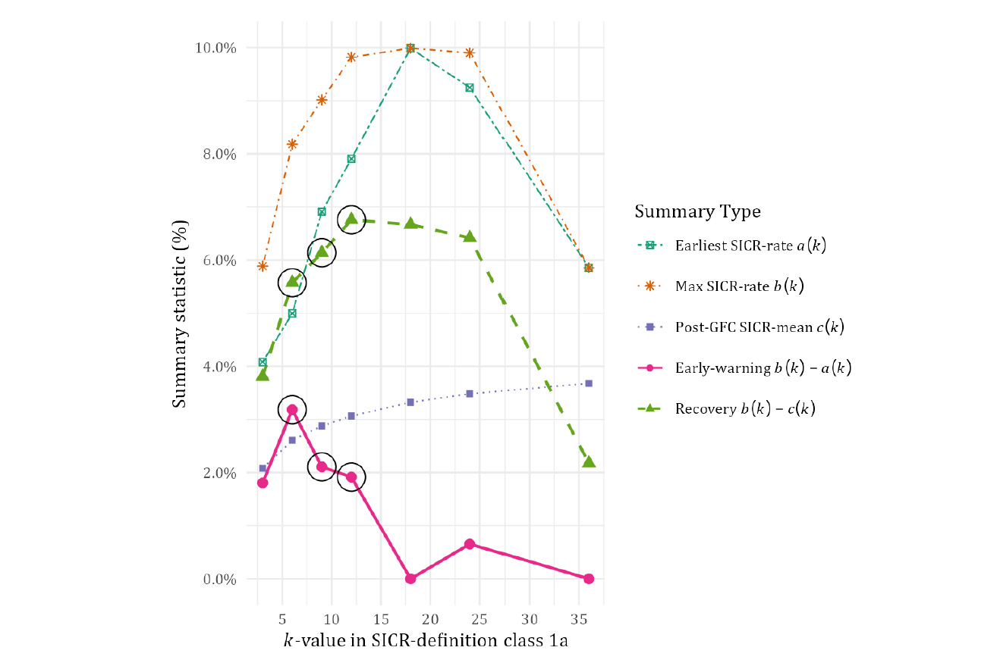

In the figure below, we show the time graphs of actual $𝐴_𝑡$ vs expected $𝐵_𝑡$ SICR-rates over calendar time 𝑡 for 𝑘 ∈ {3, 6, 9, 12}. Ideally, both time graphs should closely overlap each other, which would imply that our aggregated SICR-predictions agree with reality. One can measure the level of such agreement using the mean absolute error
(MAE) between $𝐴_𝑡$ and $𝐵_𝑡$.

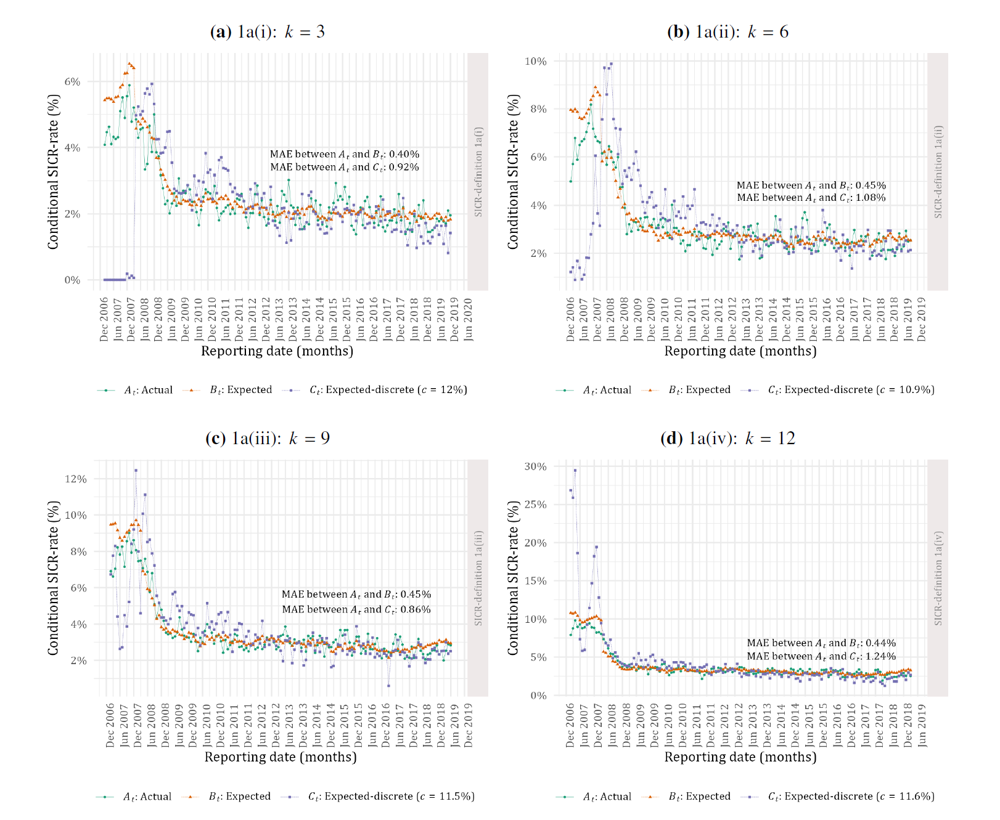

### **SICR Performance Metrics**

An important component of IFRS 9 modelling is the set of staging criteria. The evaluation of the staging criteria can be performed with quantitative indicators on stage transfers.

These types of metrics should be used to adequately assess the SICR criteria, including the calibration of quantitative SICR criteria.

- Proportion of transfers to stage 2 due to change in PD
- Proportion of transfers to stage 2 due solely to qualitative criteria
- Proportion of transfers to stage 2 due solely to backstop indicators
- Difference in PD for stage 2 and stage 1
- Stage 2 outflow to stage 1 (3-month average)
- Proportion of stage 3 that spent less than 12 months in stage 2
- Proportion of stage 3 that spent less than 6 months in stage 2
- Assessment of transition matrix among stages
- Comparison between transfer rate from stage 1 to 3 and from stage 2 to 3
- Proportion of stage 3 exposures moved directly from stage 1
- Comparison between default rates of stage 1 and Stage 2
- Average time in stage 2 before moving to stage 3


Some of these measures focus on SICR-predictions at the loan account-level (as summarised over time), while others are defined at the portfolio-level; both aggregation levels provide useful perspectives. These performance measures can also be applied more generally on the predictions and/or decisions of any binary SICR-classification system under IFRS 9. Doing so can foster comparability with our results, as well promote standardisation across the industry when evaluating or auditing SICR-decisions.

#### **Prevalance**

Assume a sample $D = \{𝑖, 𝑡, 𝑦_{𝑖𝑡}\}$ of binary-valued SICR-outcomes $𝑦_{𝑖𝑡}$ that are observed for accounts 𝑖 = 1, ... ,𝑁 at each period $𝑡 = 𝑡_1, . . . , 𝑇_𝑖 − 𝑘$ over each account’s lifetime $𝑇_𝑖$ from its time of initial recognition $𝑡_1$.

Given D of size $𝑛 = |D|$, we estimate the prevalence using Iverson brackets [·] as:

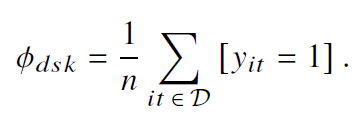

Put differently, 𝜙 is the proportion of rare events in D, which also measures the degree of class imbalance. Longer outcome periods also result in fewer observed SICR-outcomes, which explains the decreasing 𝜙-values, thereby signifying increased rarity.

#### **SICR-rates**

Denoted as $𝐴_𝑡$ , the SICR-rate estimates at reporting/calendar time 𝑡 the portfolio-level transition probability of moving from Stage 1 to Stage 2 impairment over a 𝑘-month period. More formally, $𝐴_𝑡$ estimates at 𝑡 the conditional probability $P(𝑌_{𝑡+𝑘} = 1| 𝑌_𝑡 = 0)$ of becoming SICR-flagged later at 𝑡 + 𝑘, where $𝑌𝑡 ,𝑌_{𝑡+1}, . . .$ are Bernoulli random variables that represent the SICR-status over 𝑡, as given by $G(𝑑, 𝑠, 𝑡)$.

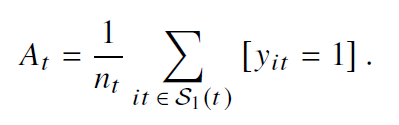

While the eqaution above yields the actual SICR-rate over time, the account-level predictions from an underlying SICR model can be similarly aggregated into an expected SICR-rate $B_𝑡$ , which can be duly compared to $𝐴_𝑡$ . This $B_𝑡$ -quantity similarly estimates at 𝑡 the conditional probability $P(𝑌_{𝑡+𝑘} = 1| 𝑌_𝑡 = 0, 𝑿)$ of becoming SICR-flagged later at 𝑡 + 𝑘, given the random input vector 𝑿. 

Estimating this probability implies developing a SICR-model from
data, which can then be used to render predictions on new data.

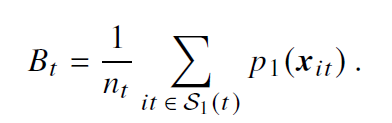

We formulate another variety of $B_t$ called the discretised expected SICR-rate $𝐶_𝑡$, wherein the underlying SICR-model (itself a discriminative/probabilistic classifier) is first dichotomised into a discrete classifier. This dichotomisation requires evaluating each SICR-prediction against a static cut-off 𝑐 ∈ [0, 1], thereby producing a
discrete SICR-prediction. 

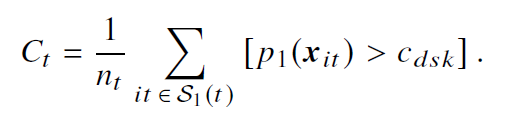

#### **Mean Rate**

This quantity is simply the sample mean of portfolio-level SICR-rates over time. Given the actual SICR-rates $𝐴_𝑡$ we estimate the SICR-mean over reporting time $𝑡 = 1, . . . , 𝑡_𝑛$ as:

$\bar A = \frac{1}{t_n} \sum_t A_t$

#### **Instability**

Denoted as 𝜎, the instability refers to the degree to which a series of portfolio-level SICR-rates varies over time.

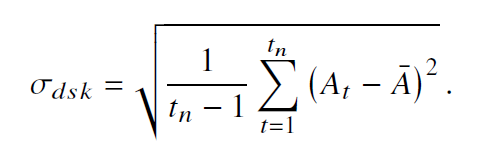

#### **Prediction Dynamicity**

Denoted as 𝜔, the dynamicity represents the extent to which the SICR-predictions (or probability scores) vary over the lifetime of an average loan account.

More formally, we first estimate each $𝜔_𝑖$ by calculating the account-level standard deviation of scores for each account 𝑖 in a given sample D, expressed as:

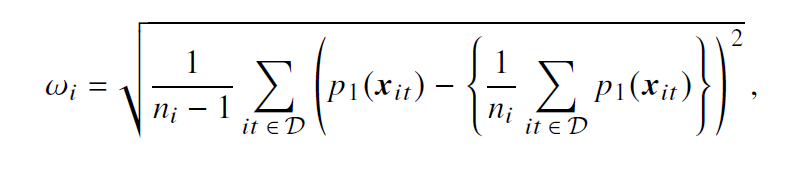

where $𝑛_𝑖 = 𝑇_𝑖 − 𝑘 > 0$ denotes the number of probability scores that are available for account 𝑖 in D. We finally estimate 𝜔 as:

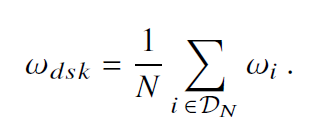

Smaller outcome periods clearly yield more accurate SICR-models that also produce more dynamic account level SICR-predictions. However, this dynamicity may not necessarily translate to the portfolio-level, especially since smaller 𝑘-values also produce more stable SICR-rates. At the account-level, extremely dynamic SICR-predictions (e.g., $𝑘 ≤ 3$) can lead to rapid oscillations in moving an account between Stages 1 and 2 over time. This oscillatory effect dampens the overall transition into Stage 2 when aggregating across accounts, hence the less responsive SICR-rate.

#### **AUC & ROC & Gini**

Secondly, the area under the curve (AUC) summarises a classical ROC-analysis (receiver operating characteristic) in measuring a model’s discriminatory power. 

AUC-values suggest that smaller outcome periods yield more accurate SICR-models than longer periods. This result corroborates the work of Kennedy et al. (2013) and Mushava and Murray (2018) wherein the outcome period was similarly varied in PD-modelling – an older ‘cousin’ of SICR-modelling. The plateauing effect in AUC-values suggest yet again that examining smaller 𝑘 ≤ 18 values is a more worthwhile endeavour.

This trend is mirrored in the discrete AUC-values, having dichotomised the SICR-predictions using 𝑐 as thresholds. Fewer SICR-outcomes can generally exacerbate the modelling task, which is why AUC decreases as 𝑘 increases.

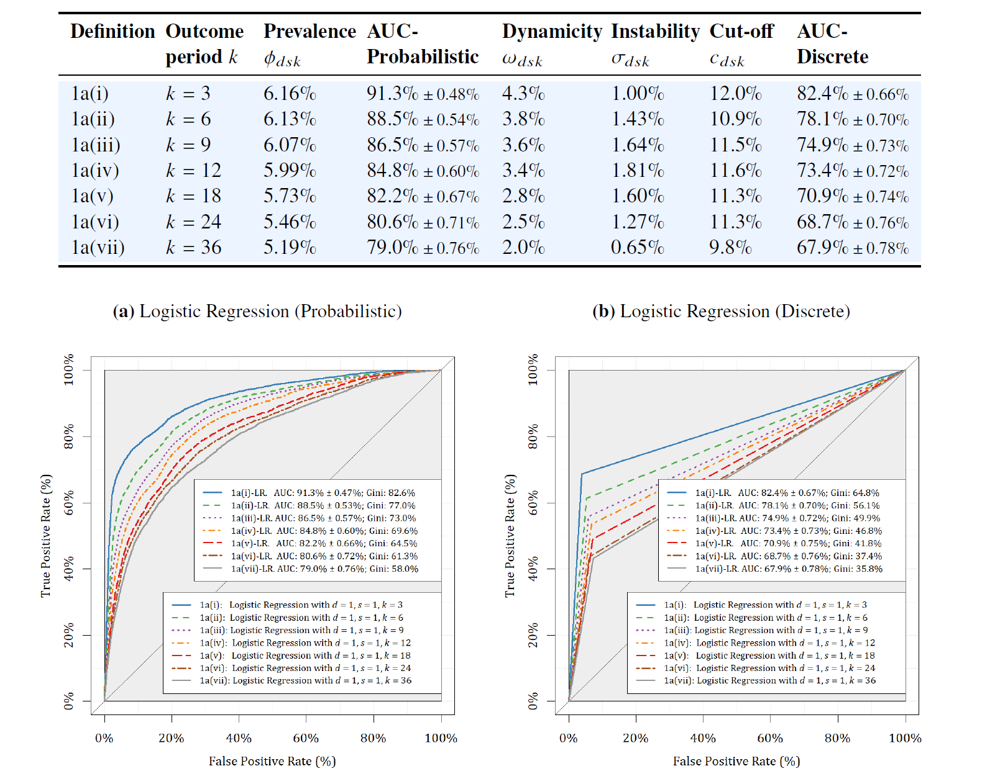

The midpoint 𝑘 = 9 therefore seems ‘optimal’ when considering the various trade-offs.

#### **MAE**

Most mean absolute error (MAE) between $𝐴_𝑡$ and $𝐵_𝑡$ ($𝑚_1$), are fairly similar with a mean error of 0.44% across 𝑘, barring 𝑘 ≥ 36. This result corroborates the relatively high AUC-values in the table above and visually suggests greater agreement as 𝑘 increases. Having dichotomised the SICR-models, a discretised expected SICR-rate ($C_𝑡$) emerges, which is similarly compared to 𝐴𝑡 and summarised again with the MAE ($𝑚_2$). Clearly, there is more disagreement between either rates, particularly during the 2008-GFC, with a mean $𝑚_2$-value of 1.11% across 𝑘; almost three times larger that of $𝑚_1$. Nonetheless, the smallest $𝑚_2$-value still occurred at 𝑘 = 9, which further supports its selection as the prudential choice.

### **Modelling vs Comparison** 🟢

Our SICR-modelling framework aims to provide a new and flexible way of conducting SICR-classification that is more proactive, focused, accurate, and dynamic than that of the classical PD-comparison approach. It is only natural then to compare the old to the new in identifying a superior approach. 

We therefore examine a few different choices of 𝑢 ∈ {100%, 120%, 150%, 180%, 200%, 300%} using discretion, though which deliberately includes the candidate 𝑢 = 200% from the European Banking Authority (2018), or EBA. Accordingly, the actual and discretised expected 1-month SICR-rates can be estimated respectively from the resulting sample of $𝑦_{𝑖𝑡}$ and $ℎ(𝒙_{𝑖𝑡})$ values. The prediction accuracy of the resulting SICR-classification is similarly gauged using ROC-analysis.

In summarising the ROC-analysis, the AUC-values clearly indicate that the prediction accuracy of $H$ is substantially inferior to that of any SICR-model, regardless of 𝑢.

Moreover, the AUC-values appear to be a monotonically decreasing function of 𝑢, where the AUC seems to deteriorate rapidly for 𝑢 ≥ 150%. The
EBA-recommended threshold of 𝑢 = 200% produced some of the most inaccurate SICR-predictions.

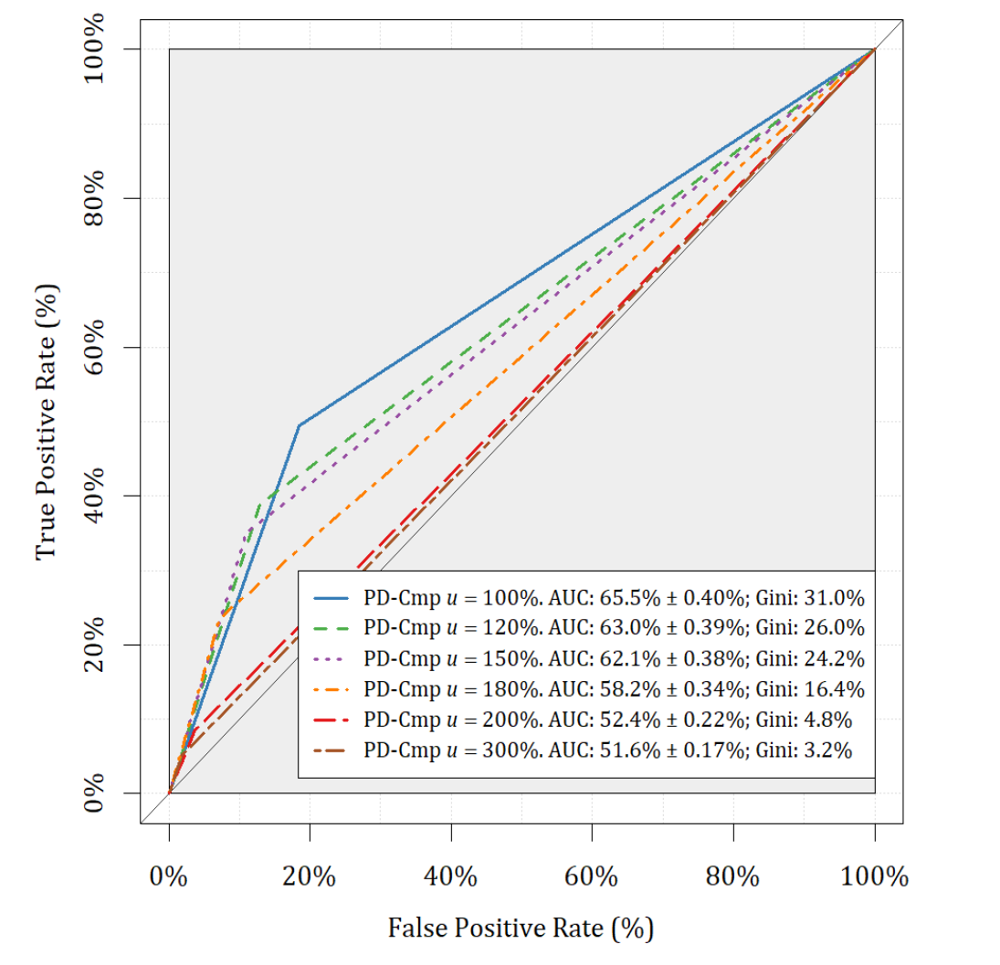

In comparing approaches, we select SICR-definition 1b(iii) and consider the resulting SICR model, which was previously motivated in subsection 4.3 as one of the best-performing SICR-models. Using the corresponding $𝑐_{129}$-value from Table 4 for this definition (𝑑 = 1, 𝑠 = 2, 𝑘 = 9), we dichotomise this SICR-model and similarly evaluate its discrete predictions within the validation set using ROC-analysis.

The resulting AUC-value of 76.8% indicates a decent level of accuracy, which compares favourably to that of the $H$-classifier. While its account-level prediction accuracy is clearly atrocious, the $H$-classifier may perform more admirably on the portfolio-level.

We therefore compare the time graphs of actual vs discretised expected SICR-rates, respective to both approaches and shown below. All of the expected rates across both approaches seemingly exceed their actual counterpart for most periods, which is certainly risk-prudent under IFRS 9. However, the degree of such over-prediction amounts to misallocated funds and wasted provisions, which can again be measured using the MAE
between two SICR-rates. The EBA-threshold (𝑢 = 200%) achieves a respectable MAE-value, which is reasonably close to that of the SICR-model, albeit still worse. More importantly, the MAE-value of the EBA-threshold is more than 7 times lower than that of the best-AUC threshold (𝑢 = 100%). Despite its improved prediction accuracy at the
account-level, the best-AUC threshold clearly results in an overly conservative SICR-rate at the portfolio-level, which surely poses an immense opportunity cost.

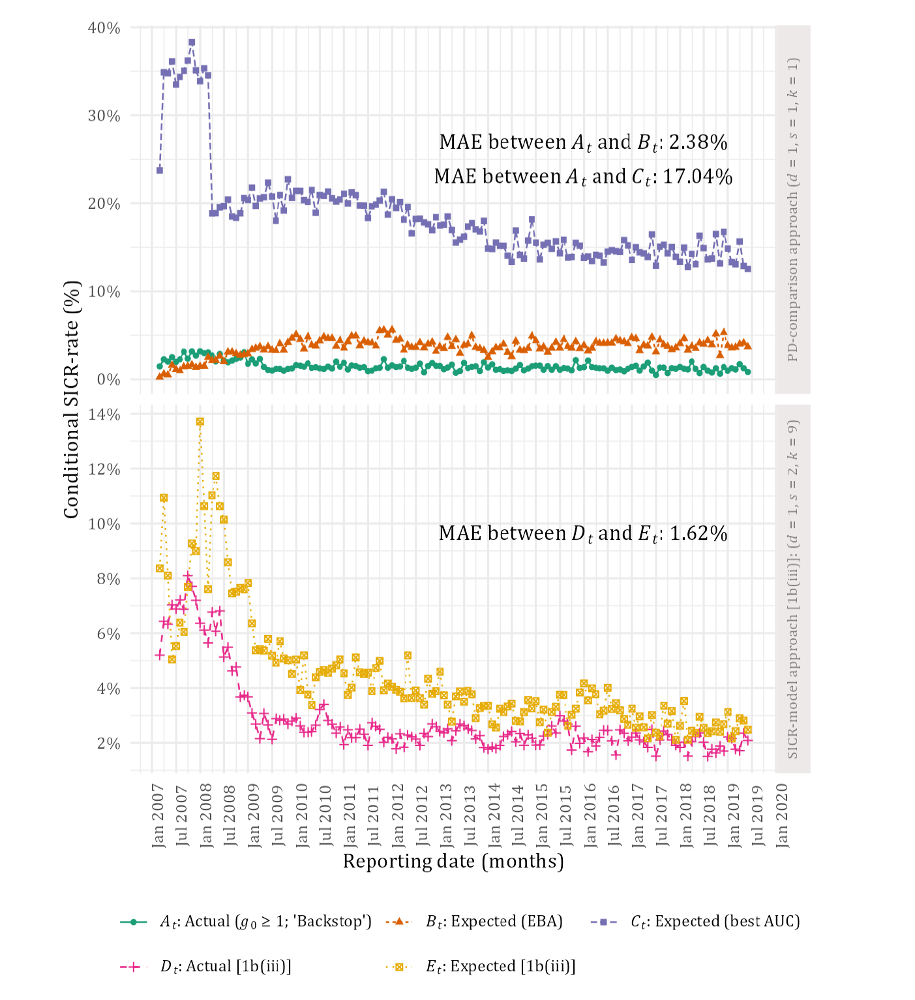

It also demonstrates different volatility patterns in the underlying SICR-rates across both approaches. In particular, the actual SICR-rate (in green) from the PD-comparison approach reacted rather mildly to the onset of the 2008-GFC, relative to its counterpart (in pink) from the SICR-modelling approach. We largely ascribe this result to the former’s use of 𝑘 = 1, which usually causes volatility in PD-modelling due to risk immaturity in the outcomes;

On the other hand, the two expected SICR-rates from the PD-comparison approach either under-predict their actual counterpart during the 2008-GFC (shown in orange: EBA-threshold), or massively over-predict it (shown in purple: best-AUC threshold). Both of these results are unsatisfactory and highlight the main drawbacks of the PD-comparison approach: 1) its tacit reliance on an appropriately accurate PD-model; and 2) its extraordinary sensitivity to the 𝑢-threshold. In contrast, both rates (in yellow and pink) from the SICR-modelling approach react more flexibly and intuitively as the 2008-GFC unfolds, having achieved a more pronounced peak at the height of the crisis without becoming excessive. Although decent, the dichotomisation of the SICR-model can surely be improved in future studies by tweaking the $𝑐_{129}$-threshold,
which should result in even better performance. However, and in finalising the approach comparison, the evidence suggests that the SICR-modelling approach is objectively the superior approach.

Our approach is more parsimonious than PD-comparisons since
the inputs of a SICR-model can relate more directly to the change in delinquency risk, instead of just default risk alone. As one of these inputs, the PD-ratio already signifies the change in risk since initial recognition, thereby rendering the predictions from a SICR-model as compliant with §5.5.9 of IFRS 9. Moreover, a SICR-modelling approach allows drawing statistical inference on the drivers of the overall SICR-process as a stochastic phenomenon, which can certainly help in portfolio management. Lastly, our approach prevents any pre-existing issues within a PD-model from bleeding into staged impairment classification under IFRS 9, which can be another practical benefit.

The 𝑠-parameter has a stabilising yet costly effect on SICR-classification, wherein SICR-events become scarcer as 𝑠 increases. Greater stickiness yield account-level SICR-predictions that are more accurate but also less dynamic over loan life. From these stickier SICR-definitions, the resulting portfolio-level SICR-rates become
less dynamic over time, have lower means, and are increasingly insensitive to the 2008-GFC. Furthermore, both 𝑘 and 𝑠 parameters interact with each other in that SICR-predictions become more accurate as 𝑘 decreases and 𝑠 increases. However, the dynamicity of account-level predictions decreases for larger 𝑠 but increases again for smaller 𝑘. Lastly, choosing 𝑑 = 2 yields extremely scarce SICR-events across all values of 𝑠 and 𝑘, which would compromise the resulting Stage 2 provision-levels if used; a result that supports the ‘backstop’ (𝑑 = 1) of IFRS 9. These trends form a reusable analytical framework in which any SICR-definition can be examined on the following four factors: the accuracy and dynamicity of the resulting SICR-predictions, the instability of implied SICR-rates, and its responsiveness to economic distress. A reasonable trade-off exists amongst these factors when choosing 𝑘 = 9 across any 𝑠-value, as well as when selecting 𝑠 = 2 across 𝑘 ∈ {6, 9}.

# **CECL Impairment Models** 🔴

In line with the general principle informing post 2007—2009 financial crisis account reform, CECL (FASB, 2016) goes in parallel with IFRS 9 by moving from an incurred perspective towards an expected loss frame. 

In terms of methodologies, the standard is not prescriptive. In particular, it is open to methods based on loss-rate, probability of default (that is, PD, LGD, EAD), discounted cash flows, roll-rate, or use an ageing schedule. 

## **Loss Rate Methods**

This is based on a historical rate of losses. As a starting point you may consider the % of loans that have gone historically bad and then make adjustments based on current or future information. 

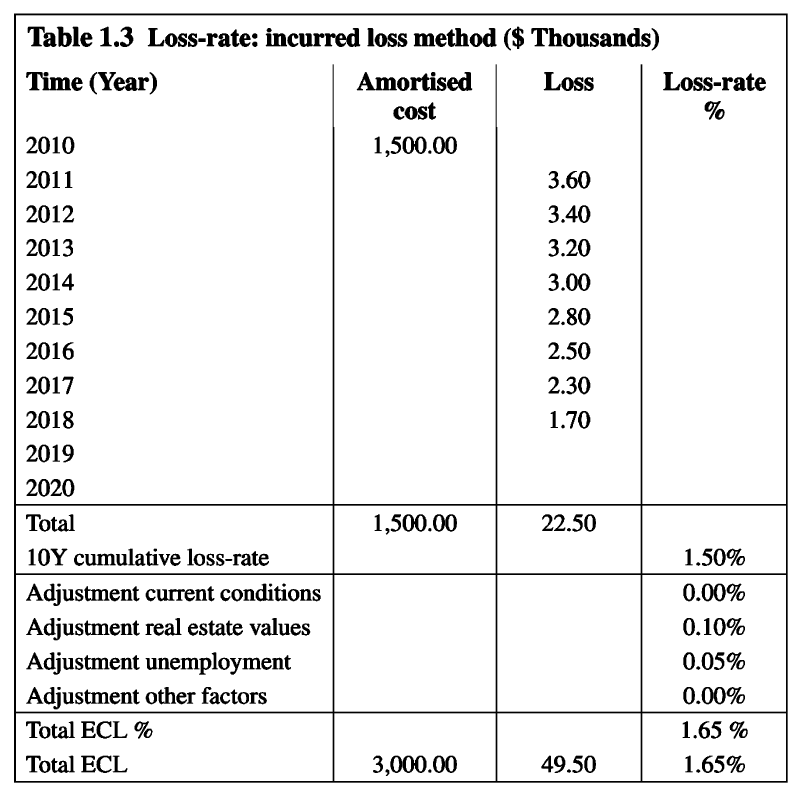

The key advantage of this method is its simplicity and easy historical data access (accounting incurred losses) and intuitive interpretation of economic adjustments. However, quantitative adjustments are difficult to justify.

## **Run-off Triangles**

This is a special case of the loss-rate method, also known as vintage analysis. Loans are grouped by similar risk profiles and by origination period. 

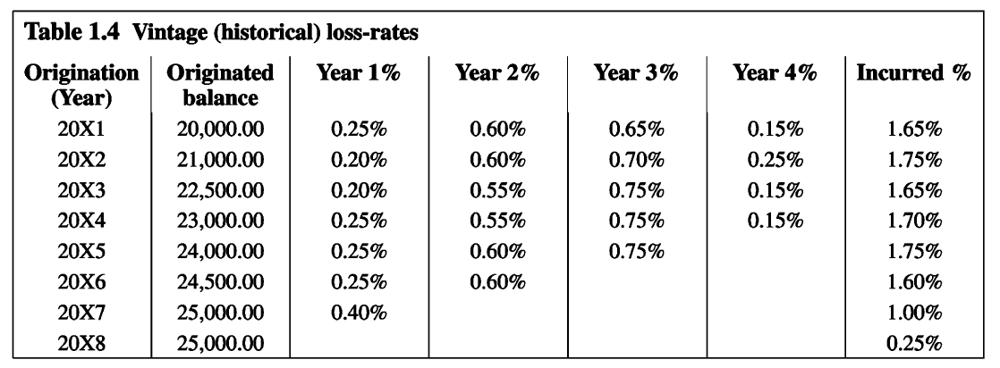

One may consider an average loss % or median loss % for each year after orginiation as expected loss. 

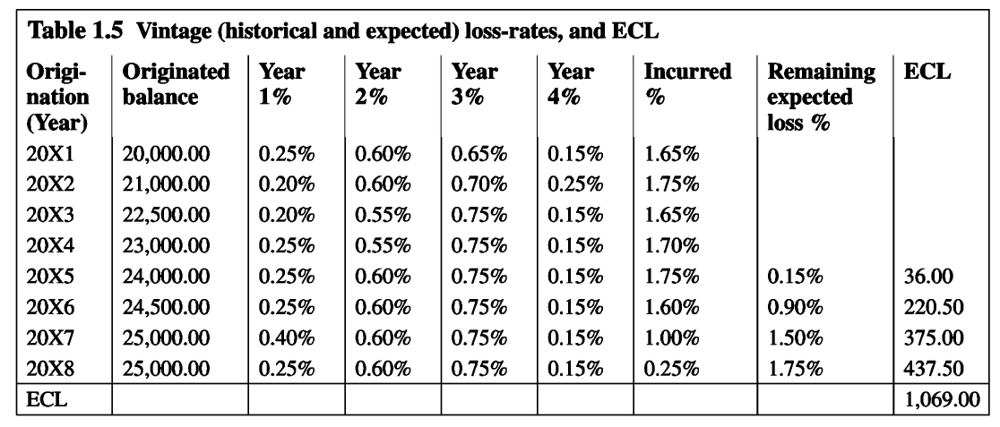


## **DCF**

Banks may use a DCF model to estimate future CFs. This may not be practical for banks with lenghty repayment terms and no prepayment data, may not be practical or worthwhile. On, the contrary this is viable when you have detailed info on asset cash flows and the portfolios are made up of homogeneous products.

## **Probability of Default Method**